# ECE 657A Assignment 2

- Juan Manuel Gomez Gonzalez
- Natalia Hoyos Velasquez
- Ruoxuan Xu

The Assignment aims to use the Bank Marketing dataset and a splice junction on DNA sequence dataset to gain experience on the use of classification methods.

The file bank-additional.zip taken from [1] contains two .csv file (bank-additional.csv and bank-additional-full.csv) and the data set documentation (bank-additional-names.txt). The file bank-additional.csv was used as the data source and the documentation was used to understand the dataset's contents and to identify the column labels.

The splice junction on DNA sequence dataset was given for the assignment.

Python 3.7 was used for this homework, in Windows 10 using Anaconda and Jupyter Notebook. The Pandas, Matplotlib and Scipy.stats libraries for Python were used.

The Pandas 10 minute tutorial, Pandas Cheat Sheet and Pandas CookBook were used to learn how to use the basic functions of Pandas. These documents can be obtained from [2]. One of Pandas' premise is that it permits the easy creation of a component called DataFrame, which facilitates the manipulation of data and many operations that can be carried out with it.

For the statistical component of the homework, Scipy.stats and numpy were used. The tutorial for Scipy.stats’ statistical functions can be found in [3], and Numpy’s statistical functions can be seen in [4]. These references indicate the way of using the methods for obtaining the normality test, Z-Score and Winsorization functions.

Matplotlib’s API guide [5] as well as its gallery [6] and Real Python’s matplotlib guide [7] were used to understand matplotlib’s basics and how to graph using Python. Matplotlib eases the construction and display of figures, including histograms and many types of plots, in an easy to use scheme, similar even to Matlab's own.

Scikitlearn library is also used in the project, and Sebastian Raschka's blog on the use of standardization techniques is also used [8, 9]. The Seaborn library is also used in order to plot and graph information found using the other libraries. Seaborn's documentation can be found in [10].

## Libraries used
- Pandas was imported to handle the dataframes.

- Scikit Learn: This is an open-source machine learning library for Python and contains a helpful preprocessing module that can help us do the normalization and standardization

- Seaborn was used to build the plot.

# talk about scipy, collections imblearn

In [1]:
##--Importing necessary libraries
import pandas as pd 
import numpy as np
from scipy import stats

import seaborn as sns

from collections import Counter
import matplotlib.pyplot as plt

from imblearn.over_sampling import SMOTENC

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn import preprocessing, tree, metrics
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
from sklearn.metrics import roc_curve, auc
from sklearn.svm import SVC

from IPython.display import Image 

import graphviz

import pydot 



import timeit

##--Disabling the warnings for better notebook visibility
import warnings
warnings.simplefilter('ignore') 

##--Setting SNS palette and parameters
plt.style.use('seaborn-whitegrid')

# sns.set(style='whitegrid', palette='Set1')
plt.style.use('seaborn-notebook')
SMALL_SIZE = 16
MEDIUM_SIZE = 18
BIGGER_SIZE = 23

##############################################
# plt.style.use('seaborn-darkgrid')


plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=BIGGER_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=MEDIUM_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

### Question I: Revisiting HW4 Bank Classification with New Tools (for dataset A)

#### 1. Load a simple dataset and perform some basic data preprocessing to fill out "unknowns", outliers or other invalid data. Explain what preprocessing was performed and why. Also, change categorical data into numerical features using pandas.get dummies.

The dataset was inspected and it was noticed that it is stored as a comma separated values (csv) file and each value is separated by a semi-colon (;). The file contains a header with the column names. 

The file was taken directly from the dataset url and loaded as a pandas dataframe with parameters for the delimiter specified to ";". The first 5 rows can be seen in the table below.

In [2]:
##--Reading the file
df_bank = pd.read_csv('bank-additional.csv', sep = ';')
df_bank.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,30,blue-collar,married,basic.9y,no,yes,no,cellular,may,fri,...,2,999,0,nonexistent,-1.8,92.893,-46.2,1.313,5099.1,no
1,39,services,single,high.school,no,no,no,telephone,may,fri,...,4,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
2,25,services,married,high.school,no,yes,no,telephone,jun,wed,...,1,999,0,nonexistent,1.4,94.465,-41.8,4.962,5228.1,no
3,38,services,married,basic.9y,no,unknown,unknown,telephone,jun,fri,...,3,999,0,nonexistent,1.4,94.465,-41.8,4.959,5228.1,no
4,47,admin.,married,university.degree,no,yes,no,cellular,nov,mon,...,1,999,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8,no


In [3]:
df_bank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4119 entries, 0 to 4118
Data columns (total 21 columns):
age               4119 non-null int64
job               4119 non-null object
marital           4119 non-null object
education         4119 non-null object
default           4119 non-null object
housing           4119 non-null object
loan              4119 non-null object
contact           4119 non-null object
month             4119 non-null object
day_of_week       4119 non-null object
duration          4119 non-null int64
campaign          4119 non-null int64
pdays             4119 non-null int64
previous          4119 non-null int64
poutcome          4119 non-null object
emp.var.rate      4119 non-null float64
cons.price.idx    4119 non-null float64
cons.conf.idx     4119 non-null float64
euribor3m         4119 non-null float64
nr.employed       4119 non-null float64
y                 4119 non-null object
dtypes: float64(5), int64(5), object(11)
memory usage: 675.9+ KB


In [4]:
tot = df_bank.iloc[:,0].count()
tot_yes = df_bank[df_bank['y']=='yes'].iloc[:,0].count()
per_yes = round(tot_yes/tot*100,2)

print("The dataset is highly unbalanced having a total of " + 
      str(tot) + " samples from which " + str(per_yes) 
      + "% are of class 'yes' and " + str(100-per_yes) 
      + "% are of class 'no'.")

The dataset is highly unbalanced having a total of 4119 samples from which 10.95% are of class 'yes' and 89.05% are of class 'no'.


In [5]:
df_bank.iloc[:,0].count()

4119

The dataset is related to the direct marketing campaigns based on phone calls of a banking institution located in Portugal. The dataset contains 4119 instances and 21 client and contact attributes. The goal attribute (variable y) describes if the client will subscribe a term deposit.

The dataset is highly unbalanced having a total of 4119 samples from which 10.95% are of class 'yes' and 89.05% are of class 'no'.

The documentation found in [1] states that the duration column is not known before a call is performed then it should be used for benchmark purposes only and it is advised to discard this column if the intention is trying to create a realistic predictive model.

In [6]:
# Dropping "duration"
df_bank.drop(columns = ['duration'],  inplace=True)

#### Missing Values
The dataframe has missing values denoted as “unknown” that have to be changed to Not a number (NaN) for an easier analysis. It can also be checked for rows that only contain NaN values and delete them, as these samples do not add any information to the dataset. 

In [7]:
#Replacing the 'unknown' entries with NaN values so they can be counted
df_bank = df_bank.replace(to_replace = 'unknown', value = np.nan)

#Remove all rows that only contain NaN
df_bank=df_bank.dropna(how='all') 

#Show the non-null values present
print(df_bank.info())
df_bank.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4119 entries, 0 to 4118
Data columns (total 20 columns):
age               4119 non-null int64
job               4080 non-null object
marital           4108 non-null object
education         3952 non-null object
default           3316 non-null object
housing           4014 non-null object
loan              4014 non-null object
contact           4119 non-null object
month             4119 non-null object
day_of_week       4119 non-null object
campaign          4119 non-null int64
pdays             4119 non-null int64
previous          4119 non-null int64
poutcome          4119 non-null object
emp.var.rate      4119 non-null float64
cons.price.idx    4119 non-null float64
cons.conf.idx     4119 non-null float64
euribor3m         4119 non-null float64
nr.employed       4119 non-null float64
y                 4119 non-null object
dtypes: float64(5), int64(4), object(11)
memory usage: 675.8+ KB
None


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,30,blue-collar,married,basic.9y,no,yes,no,cellular,may,fri,2,999,0,nonexistent,-1.8,92.893,-46.2,1.313,5099.1,no
1,39,services,single,high.school,no,no,no,telephone,may,fri,4,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
2,25,services,married,high.school,no,yes,no,telephone,jun,wed,1,999,0,nonexistent,1.4,94.465,-41.8,4.962,5228.1,no
3,38,services,married,basic.9y,no,NaN,NaN,telephone,jun,fri,3,999,0,nonexistent,1.4,94.465,-41.8,4.959,5228.1,no
4,47,admin.,married,university.degree,no,yes,no,cellular,nov,mon,1,999,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8,no


In [8]:
print(df_bank.isnull().sum())

age                 0
job                39
marital            11
education         167
default           803
housing           105
loan              105
contact             0
month               0
day_of_week         0
campaign            0
pdays               0
previous            0
poutcome            0
emp.var.rate        0
cons.price.idx      0
cons.conf.idx       0
euribor3m           0
nr.employed         0
y                   0
dtype: int64


It can be seen in the information above that no variable has a significant number of missing values that would require to drop the whole column. 

The features that contain missing values are “job”, "marital", “education”, "default", "housing" and "loan". Replacing the missing values of these attributes with the mean would not make sense since these are unordered categorical values. Two strategies could be used in this case, treat the missing values as a separate class or replace them with the mode.

In this assignment they will be treated as a separate class since replacing the missing values with the mode could potentially add noise to the model.

In [9]:
# #Replacing the 'unknown' entries with NaN values so they can be counted
# df_bank = df_bank.replace(to_replace = np.nan, value = 'unknown')

The UCI dataset description found in [1] states that the pdays column represents the number of days passed by after the client was last contacted from a previous campaign. When a client has not been previously contacted, the entry would have a value of 999. 

Since these entries are an order of magnitude bigger than the entries of clients that have already been contacted, the normalization process might become difficult or the outlier detection method might label these entries as outlier.There are different strategies to deal with this column. One could be to change the 999 value with the maximum value of the feature, or two time the maximum. 

999    3959
3        52
6        42
4        14
7        10
10        8
12        5
5         4
2         4
9         3
1         3
13        2
18        2
16        2
15        2
0         2
14        1
19        1
21        1
17        1
11        1
Name: pdays, dtype: int64

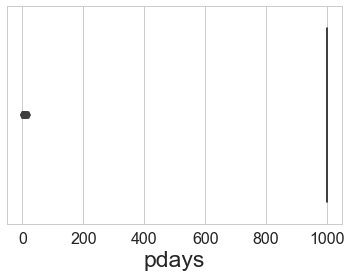

In [10]:
sns.boxplot(x=df_bank['pdays'])
df_bank['pdays'].value_counts()
# data['pdays'].isna().sum().sum()

3,959 samples were found in the pdays column with a value of 999. 


In [11]:
mapping = {'yes':1, 'no': 0}
df_testing = df_bank.copy()
df_testing['y']= df_testing[ 'y'].map(mapping)

# df_testing = df_testing.replace(to_replace = 999, value = 30)

# df_testing.plot.scatter(y= 'pdays', x= 'y')
print(df_testing['y'].sum())
print(df_testing.loc[df_testing['pdays']==999]['y'].sum())

451
351


In [12]:
# # # # Dropping "pdays"
# df_bank.drop(columns = ['pdays'],  inplace=True)

#### Handling Outliers
For the removal of outliers, the Z-Score and the Tukey Fence based on the Inter Quartile Range (IQR) methods were considered. 

The Z-Score uses the principle that any values outside of an n amount of standard deviations from the mean is an outlier, and therefore should be deleted from the sample [11].This technique is only valid when used in a normal distribution [12].

Contrary to Z-Score, the Tukey Fence can be used in data that does not follow a normal distribution. This technique uses the median and the inter quartile range as opposed to the mean and standard deviation in order to filter out the outliers [13].The Tukey fence states that an outlier is any value outside of the range comprised of the first quartile -1.5 times the IQR and third quartile + 1.5times the IQR.

In [13]:
#Create a function to test the normality for each variable using scikit's normality test
alpha = 1e-3
def test_normal(col, string=''):
    k2, p = stats.normaltest(col)
    
    if string != '':
        if p >= alpha:  # null hypothesis: x comes from a normal distribution
            print("The null hypothesis cannot be rejected: The feature: " + string + " may come from a normal distribution")
    #    else:
    #        print("The null hypothesis can be rejected: The feature: " + string + " does not come from a normal distribution")
    return p

#Check each feature and see if it fits a normal distribution. Print the amount of features that did pass
df_numeric = df_bank.select_dtypes(include = ['int64', 'float64'])
df_string = df_bank.select_dtypes(exclude = ['int64', 'float64'])
df_rown, df_coln = df_numeric.shape
df_rows, df_cols = df_string.shape

p_values=[test_normal(df_bank[col], col) for col in df_numeric.columns]

num_normal = sum([value>alpha for value in p_values])

print("There are " + str(num_normal) + " features that passed the normality test")

There are 0 features that passed the normality test


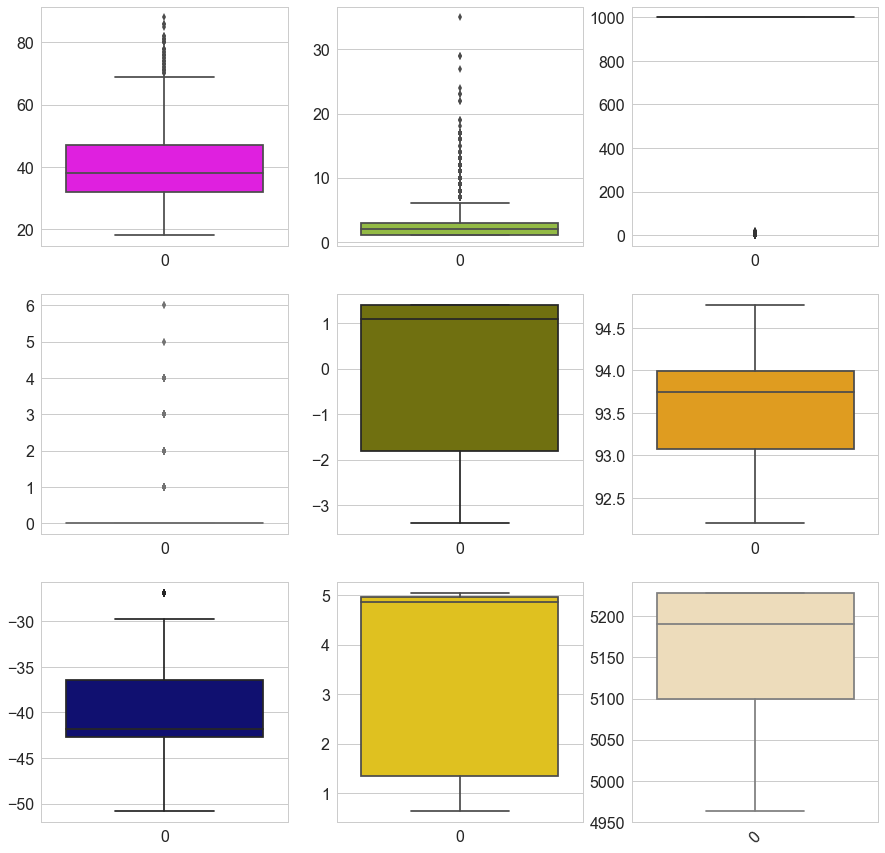

In [14]:
from math import ceil
from random import randint

#Graph the box plot of the numerical features 
fig, ax = plt.subplots(ceil(df_coln/3),3, figsize=(15,15))
col=['skyblue', 'forestgreen', 'gold', 'red', 'gray', 'magenta', 'turquoise', 'maroon', 'lavender', 'orange', 'teal',
     'tomato', 'violet', 'silver', 'olive', 'navy', 'wheat', 'yellowgreen', 'sienna', 'coral', 'azure', 'aqua',
     'lightblue', 'lightgreen', 'chartreuse']
j=0
k=0
for i in range(df_coln):
    if j>2:
        j=0
        k=k+1
    sns.boxplot(data=df_numeric.iloc[:,i], ax=ax[k,j], color=col[randint(0, len(col)-1)])
#     sns.swarmplot(data=df_numeric.iloc[:,i], color=".25", ax=ax[k,j])
    plt.xticks(rotation=45)
    j=j+1
#     plt.show()

Box plots of the different numerical attributes, standardized for easier visualization:

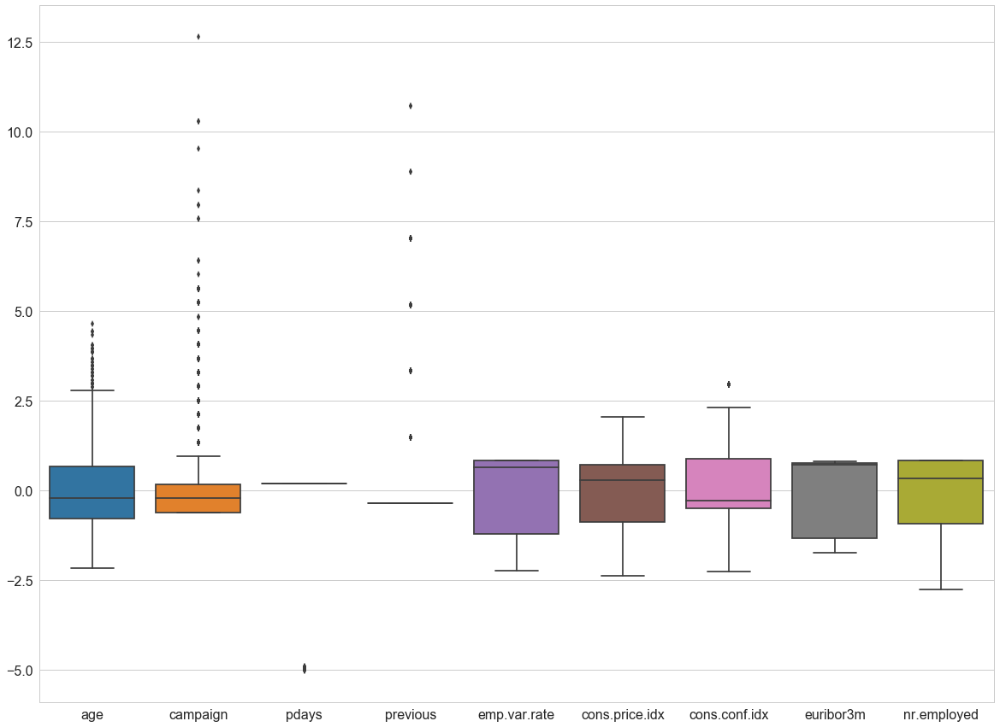

In [15]:
from sklearn import preprocessing
figure = plt.figure(figsize=(20,15))
sns.boxplot(data=pd.DataFrame(preprocessing.StandardScaler().fit_transform(df_numeric), columns = df_numeric.columns))

In [16]:
#Create a function that plots the histogram of a dataframe's column, and optionally displays certain characteristics
def histPlot(df, bins_value='auto', std_dev=3, mean_=True, iqr=0, plot_color='teal', title_extra='',
             alpha_val=0.8, new_fig=True):
    if new_fig == True:
        figure = plt.figure(figsize=(10,5))
    if isinstance(bins_value, int):
        if bins_value>0:
            bins_val = bins_value
        else:
            bins_val = np.histogram_bin_edges(df.values, 'auto')
    else:
        bins_val = np.histogram_bin_edges(df.values, str(bins_value))
    
    df.plot.hist(bins = bins_val, color = plot_color,
                                  title='Histogram for ' + str(df.name) + ' ' + str(title_extra),
                 legend = True, alpha = alpha_val)
    if mean_ == True:
        plt.axvline(df.values.mean(), color='k', linestyle ='dashed', linewidth = 3, label = 'Mean', alpha = 0.3)
    if std_dev != 0:
        plt.axvline(df.values.mean() + std_dev * df.values.std(),
                    color='k', linestyle='dotted', linewidth=3.5, label = str(std_dev) + ' Std deviation', alpha=0.4)
        plt.axvline(df.values.mean() - std_dev * df.values.std(),
                    color='k', linestyle='dotted', linewidth=3.5, alpha=0.4)
    if iqr != 0:
        q1, q3 = np.percentile(df, [25, 75])
        iqr_fence = (q3 - q1) * iqr
        low_fence = q1 - iqr_fence
        up_fence = q3 + iqr_fence
        plt.axvline(low_fence,
                    color='k', linestyle='-.', linewidth=2, label = 'Tukey Fence', alpha=0.3)
        plt.axvline(up_fence,
                    color='k', linestyle='-.', linewidth=2, alpha=0.3)
        
    plt.legend(loc='best')
#     plt.tight_layout()

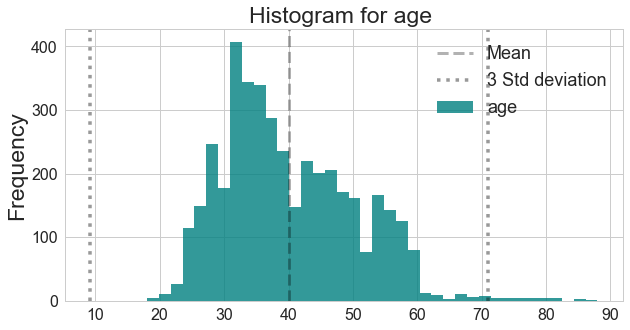

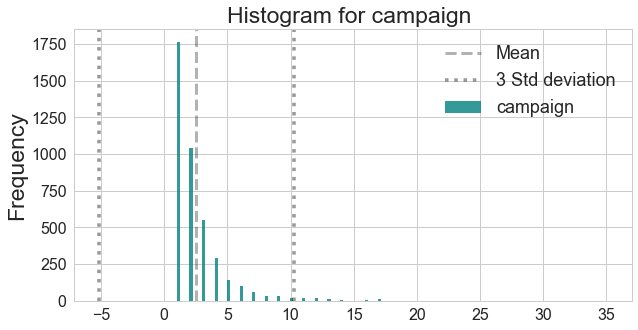

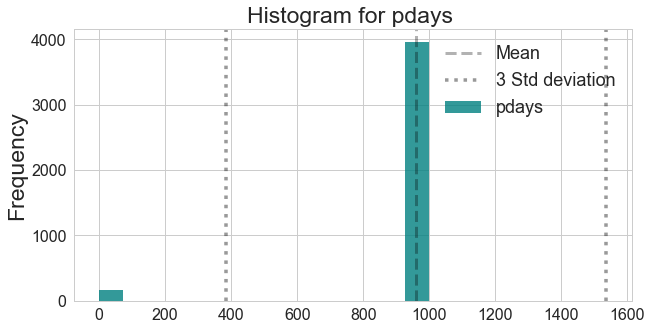

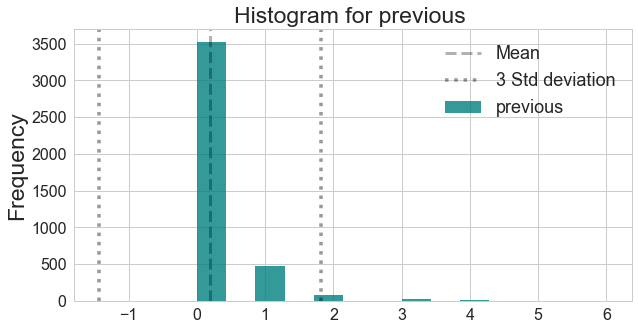

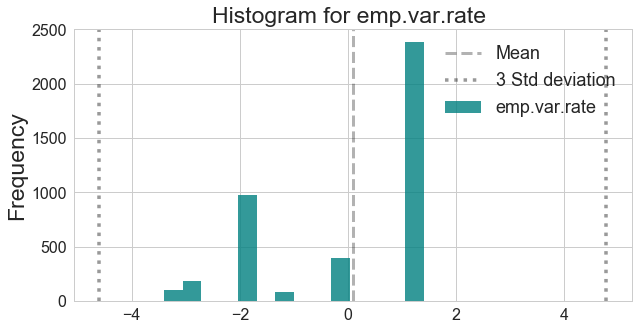

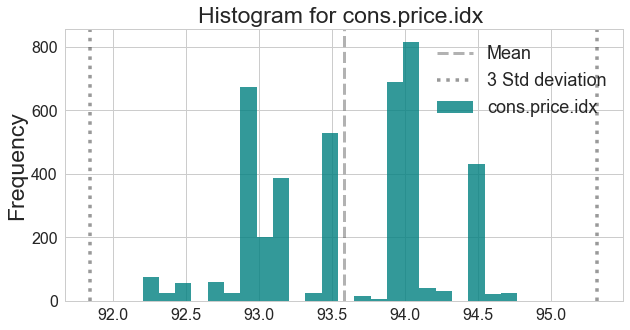

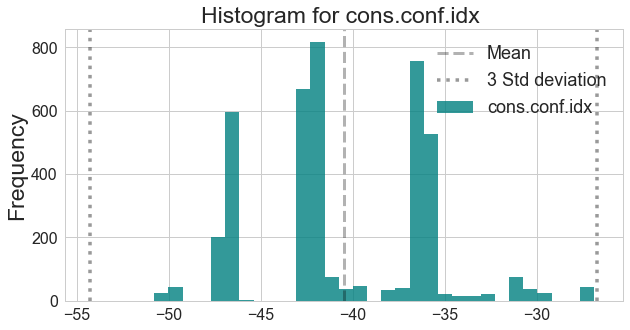

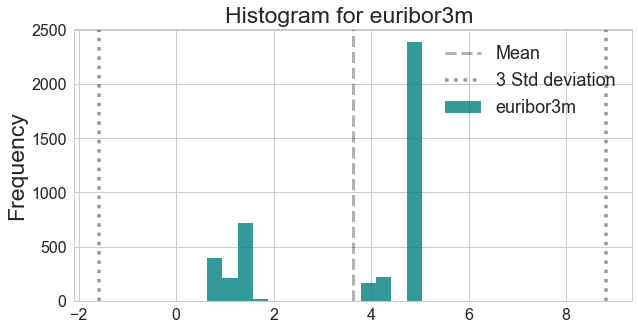

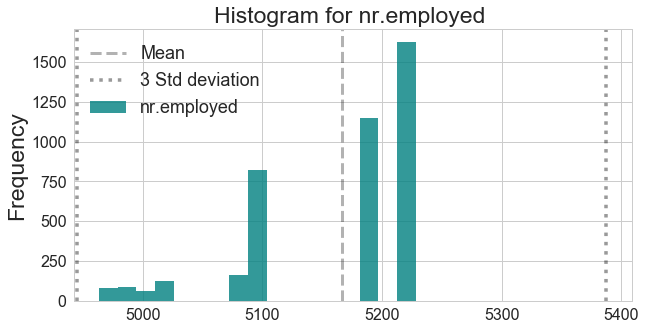

In [17]:
for i in range(df_coln):
    histPlot(df_numeric.iloc[:,i], bins_value='auto', std_dev=3)

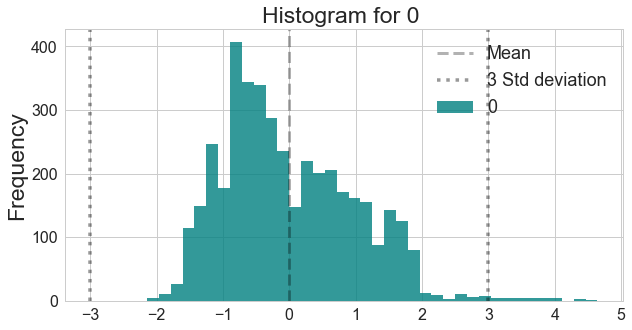

In [18]:
sc = StandardScaler()

age = sc.fit_transform(df_numeric)
age = pd.DataFrame(age)
age = age[0]

histPlot(age, bins_value='auto', std_dev=3)

In [19]:
df_bank_z=df_bank[(np.abs(stats.zscore(df_numeric)) < 3).all(axis=1)]
df_bank_zy=df_bank[(np.abs(stats.zscore(df_numeric)) < 3).all(axis=1) | (df_bank['y']=='yes').values]


In [20]:
print("\tBefore Outlier Removal \n\t    Samples\t"+ str(df_bank.iloc[:,0].count()) + 
      "\n'yes' Class Samples\t" + str(df_bank[df_bank['y']=='yes'].iloc[:,0].count())+'\n\n'
      
     "\tAfter Outlier Removal with 3 std \n\t    Samples\t"+ str(df_bank_z.iloc[:,0].count()) + 
      "\n'yes' Class Samples\t" + str(df_bank_z[df_bank_z['y']=='yes'].iloc[:,0].count())+'\n\n'
     
     "\tAfter Outlier Removal with 3 std keeping all 'yes' samples \n\t    Samples\t"+ str(df_bank_zy.iloc[:,0].count()) + 
      "\n'yes' Class Samples\t" + str(df_bank_zy[df_bank_zy['y']=='yes'].iloc[:,0].count())+'\n\n')

	Before Outlier Removal 
	    Samples	4119
'yes' Class Samples	451

	After Outlier Removal with 3 std 
	    Samples	3798
'yes' Class Samples	331

	After Outlier Removal with 3 std keeping all 'yes' samples 
	    Samples	3918
'yes' Class Samples	451




At the beginning, 321 outliers were deleted from the sample. Of this, 120 (37%) were of class ‘yes’. Due to the highly unbalanced nature of the dataset, it is possible that many samples of class ‘yes’ were detected as outliers due to the lack of information. It was decided to delete the outliers detected by the Z-score technique except if they were of class ‘yes’. In this way, a total of 201 samples were deleted.

In [21]:
df_bank = df_bank_zy
Counter(df_bank['pdays'])

Counter({999: 3818,
         12: 3,
         3: 39,
         6: 27,
         5: 4,
         10: 6,
         7: 8,
         15: 1,
         0: 2,
         18: 1,
         4: 5,
         19: 1,
         9: 1,
         21: 1,
         2: 1})

Removing outliers from categorical data:
After dealing with the numerical outliers it was questioned if the categorical variables might also have outliers. To solve this concern, it is first needed to define what an outlier in a categorical data might be since an unordered categorical data does not have extreme values. Categorical outliers represent those samples which have values that are infrequent in the dataset. 


In [22]:
df_string = df_string.replace(to_replace = np.nan, value = 'unknown')
# 
counted=[]
for i in range(df_cols):
    temp=({df_string.iloc[:,i].name:Counter(df_string.iloc[:,i])})
    counted.append(pd.DataFrame(temp))
counted  
for item in counted:
    print(item)
    r, c = item.shape
    print(sum(item.iloc[:,0])/(r*10))
    print(item.shape)
    print ("\n")

                job
admin.         1012
blue-collar     884
entrepreneur    148
housemaid       110
management      324
retired         166
self-employed   159
services        393
student          82
technician      691
unemployed      111
unknown          39
34.325
(12, 1)


          marital
divorced      446
married      2509
single       1153
unknown        11
102.975
(4, 1)


                     education
basic.4y                   429
basic.6y                   228
basic.9y                   574
high.school                921
illiterate                   1
professional.course        535
university.degree         1264
unknown                    167
51.4875
(8, 1)


         default
no          3315
unknown      803
yes            1
137.3
(3, 1)


         housing
no          1839
unknown      105
yes         2175
137.3
(3, 1)


         loan
no       3349
unknown   105
yes       665
137.3
(3, 1)


           contact
cellular      2652
telephone     1467
205.95
(2, 1)


     month

When analyzing the frequency of the categorical values the features ‘Education’ and ‘Default’ drew attention:

- It can be observed in Table 4 that there is only one sample with the value ‘illiterate’ in the ‘Education’ column. This sample is considered an outlier and is deleted from the dataset. Something similar happens with the ‘default’ feature. 
- The most common value of the ‘default’ feature is ‘no’ followed by an unknown value and only one sample with ‘yes’. This sample is also considered an outlier and deleted form the dataset.


In [23]:
df_bank = df_bank[df_bank['education'] != 'illiterate']
# df_bank = df_bank.drop('default', axis = 1)
df_bank = df_bank[df_bank['default'] != 'yes']
print(Counter(df_bank['y']))

Counter({'no': 3465, 'yes': 451})


After all the modifications, the dataset is comprised of 3916 samples.

The dataset is almost done with the preprocessing and ready to start the training of the classification algorithms. The final step is to translate the categorical features into numerical values that the model can understand. The function get_dummies converts categorical variables into indicator variables. This function creates one column for each possible instance of a given feature and they are filled with zeros and ones which specify the presence or absence of the corresponding instance.

In [24]:
col_dum = str(df_bank.drop('y', axis=1).columns.values)
df_y = df_bank.iloc[:,-1]
# Xdum = df_bank.iloc[:,:-1]
X_dum = pd.get_dummies(df_bank.iloc[:,:-1])

#### 2.	Divide data into train and test portions, justify your split decision
Before splitting the data into train and test portions it is necessary to fix the unbalance proportions of the classes. The SMOTENC function uses the Synthetic Minority Oversampling Technique (SMOTE) method which is a combination of over-sampling the class that is under-represented and under-sampling the majority class [12]. One special characteristic of the SMONTENC function is that it is able to handle mixed data such as continuous and categorical. In the case of the categorical data, the samples generated belong to the same categories as originally presented without any interpolation.

In [25]:
 # doctest: +NORMALIZE_WHITESPACE
## Over Sampling
sm = SMOTENC(categorical_features=range(9,X_dum.shape[1]),random_state=42)
X_res, y_res = sm.fit_resample(X_dum, df_y)
#Resampled dataset shape Counter({0: 900, 1: 900})
# print(y_res[y_res=='yes']).count()
# df_res=pd.concat((pd.DataFrame(X_res), pd.DataFrame(y_res, columns=['y'])), axis=1)
# df_res[df_res['y']=='yes']
# df_res
print(Counter(df_y))
Counter(y_res)

Counter({'no': 3465, 'yes': 451})


Counter({'no': 3465, 'yes': 3465})

In [26]:
df_bank

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,30,blue-collar,married,basic.9y,no,yes,no,cellular,may,fri,2,999,0,nonexistent,-1.8,92.893,-46.2,1.313,5099.1,no
1,39,services,single,high.school,no,no,no,telephone,may,fri,4,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
2,25,services,married,high.school,no,yes,no,telephone,jun,wed,1,999,0,nonexistent,1.4,94.465,-41.8,4.962,5228.1,no
3,38,services,married,basic.9y,no,NaN,NaN,telephone,jun,fri,3,999,0,nonexistent,1.4,94.465,-41.8,4.959,5228.1,no
4,47,admin.,married,university.degree,no,yes,no,cellular,nov,mon,1,999,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8,no
6,32,admin.,single,university.degree,no,yes,no,cellular,sep,mon,4,999,0,nonexistent,-1.1,94.199,-37.5,0.879,4963.6,no
7,41,entrepreneur,married,university.degree,NaN,yes,no,cellular,nov,mon,2,999,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8,no
8,31,services,divorced,professional.course,no,no,no,cellular,nov,tue,1,999,1,failure,-0.1,93.200,-42.0,4.153,5195.8,no
9,35,blue-collar,married,basic.9y,NaN,no,no,telephone,may,thu,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
10,25,services,single,basic.6y,NaN,yes,no,cellular,jul,thu,1,999,0,nonexistent,1.4,93.918,-42.7,4.958,5228.1,no


In [27]:
cols = X_dum.columns 
X_res = pd.DataFrame(X_res, columns=cols)
X_res = X_res.round({'age': 0, 'campaign': 0, 'pdays':0, 'previous':0,
             'emp.var.rate': 1, 'cons.price.idx':3, 'cons.conf.idx':1,
             "euribor3m":3, 'nr.employed':1})
# X_res['campaign']

Before applying the SMONTENC function, the dataset contained 3465 (89%) ‘no’ samples and 451 (11%) ‘yes’ samples. After applying the function, the dataset is comprised of 3465 ‘no’ samples and 3465 ‘yes’ samples (50%-50%).

Choosing the splitting data ratio is a difficult task. A training set that is too small would underfit the model due to the lack of information, and a small testing set would not be robust enough to test every possible scenario. For big datasets, 80/20 is quite a commonly occurring ratio and is referred to as the Pareto principle.

In [28]:
X = X_res
y = y_res

# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size = 0.2, 
                                                    stratify = y, 
                                                    random_state = 2)

# Feature Scaling
minmax_sc = MinMaxScaler()
cols = X_dum.columns 
X_train = pd.DataFrame(minmax_sc.fit_transform(X_train), columns=cols)
X_test = pd.DataFrame(minmax_sc.transform(X_test), columns=cols)



df_z=pd.concat((pd.DataFrame(X_test), pd.DataFrame(y_test, columns=['y'])), axis=1)

The dataset was split into a 80/20 portion. The min-max scaler estimator is fitted with the training set and scales both the training and test set.

#### 3. Apply classification using Decision Trees (DT), Random Forests (RF) and Neural Networks (NN) and run using standard libraries in your language or choice. Indicate the classification properties (example: depth of tree, size of neural network, ensembles for RF) you have chosen and justify. Briefly describe the algorithms employed by the libraries you are using (example ID3, C4.5, C5.0 and CART for DT). Make sure to run the classification on 10 features or more

After splitting the samples between training and testing sets, there is a need to split the training set to obtain a validation set to test as model hyperparameters are tuned (such as max tree depth and min samples per split).

In [29]:
# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train2, X_val, y_train2, y_val = train_test_split(X_train, y_train, 
                                                    test_size = 0.2, 
                                                    stratify = y_train, 
                                                    random_state = 1)

In order to tune the hyperparameters, various experiments have to be performed fitting the model with different values and evaluate the result with an appropriate method based on the consequences of misclassifying samples. In this particular case, the cost of misclassifying a "no" sample as a "yes" (false positive) has a low cost, it would mean calling a client without achieving a successful response. On the other hand, misclassifying a "yes" sample as a "no" (false negative) means that the bank is missing the opportunity of detecting a client that would say "yes" to the subscription of a term deposit.  

Since the false negatives is the values that has to be minimized, having a high precision is not as important as having a high recall.

First, the baseline performance of the model is obtained by training the decision tree with its default values.

In [30]:
clf_tree_base = tree.DecisionTreeClassifier(random_state=1)
clf_tree_base = clf_tree_base.fit(X_train,y_train)
y_pred_tree_base = clf_tree_base.predict(X_test)
print(metrics.classification_report(y_test, y_pred_tree_base))

              precision    recall  f1-score   support

          no       0.91      0.89      0.90       693
         yes       0.90      0.91      0.90       693

   micro avg       0.90      0.90      0.90      1386
   macro avg       0.90      0.90      0.90      1386
weighted avg       0.90      0.90      0.90      1386



In [31]:
features = list(X_train.columns)

dot_data = StringIO()  
export_graphviz(clf_tree_base, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydot.graph_from_dot_data(dot_data.getvalue())  
Image(graph[0].create_png())

As it can be seen the tree grew all the leaves it could and overfitted creating too many decisions. now it will be tried with a max depth of 3.

In [32]:
# clf_tree3 = tree.DecisionTreeClassifier(random_state=42, max_depth=3)
# clf_tree3 = clf_tree3.fit(X_train,y_train)

# dot_data = tree.export_graphviz(clf_tree3, out_file=None, 
#                       feature_names=cols,  
#                       class_names=list(set(y)),  
#                       filled=True, rounded=True) 

# # dot_data.attr(size='6,6')
# graph = graphviz.Source(dot_data)
# # graph.set_size('"5,5!"')

# features = list(X_train.columns)

# dot_data = StringIO()  
# export_graphviz(clf_tree3, out_file=dot_data,feature_names=features,filled=True,rounded=True)

# graph = pydot.graph_from_dot_data(dot_data.getvalue())  
# Image(graph[0].create_png())

After splitting the samples between traing and testing.

There is a need to split the training set to obtain a validation set to test as model hyperparameters are tuned (such as max tree depth, max nodes, min samples per split, and min samples per node).

In order to tune the hyperparameters, various experiments have to be performed fitting the model with different values and evaluate the result with an appropiate method based on the consequences of missclassifying samples. In this particular case, the cost of missclassifying a "no" sample as a "yes" (false positive) is not a very high cost, it would mean spending resources by calling to contact a client without achieving a succesful response. On the other hand, missclassifying a "yes" sample as a "no" (false negative) means that the bank is missing the opportunity of detecting a client that would say "yes" to the subscription of a term deposit. This means that we have to minimize the number of false negatives. This is the reason why having a high precision is not as important as having a high recall. 

One way to tune this hyperparameters is using a greedy algorithm that chooses the best value for the first hyperparameter, fixes it and looks up the best value for the second one and so on. The best value is the one that maximizes the recall of the ‘yes’ class. 

In [33]:
# levels = list(range(2,40,1))

# def tuning(model = "tree.DecisionTreeClassifier(", parameter="max_depth", values=levels, random=1):
#     clf_train_acc = []
#     clf_val_acc = []
#     clf_train_precision = []
#     clf_val_precision = []
#     clf_train_recall = []
#     clf_val_recall = []

#     for value in values:
#         clf_tree_temp = eval(model + "random_state="+ str(random) + "," +parameter + "=" + str(value) + ")")
#         clf_tree_temp = clf_tree_temp.fit(X_train2,y_train2)

#         y_val_pred = clf_tree_temp.predict(X_val)
#         y_train_pred = clf_tree_temp.predict(X_train2)

#         clf_train_acc.append(clf_tree_temp.score(X_train2, y_train2))
#         clf_val_acc.append(clf_tree_temp.score(X_val, y_val))

#         clf_train_precision.append(metrics.precision_score(y_train2, y_train_pred, pos_label='yes'))
#         clf_val_precision.append(metrics.precision_score(y_val, y_val_pred, pos_label='yes'))

#         clf_train_recall.append(metrics.recall_score(y_train2, y_train_pred, pos_label='yes'))
#         clf_val_recall.append(metrics.recall_score(y_val, y_val_pred, pos_label='yes'))
    
    
    
#     parameter_recall_max = values[clf_val_recall.index(max(clf_val_recall))]
#     fig, ax = plt.subplots(1,3, sharey=True, figsize=(20,10))
       
#     ax[0].plot(values,clf_train_recall, label='Training Data') #Plot the recall against the train error
#     ax[0].plot(values,clf_val_recall, label='Validation Data') #Plot the recall against the train error
# #     ax[0].set_xlabel(parameter)
#     ax[0].set_ylabel("Recall")
# #     ax[0].set_title('Recall')


#     ax[1].plot(values,clf_train_precision, label='Training Data') #Plot the precision against the train error
#     ax[1].plot(values,clf_val_precision, label='Validation Data') #Plot the precision against the train error
#     ax[1].set_xlabel(parameter)
#     ax[1].set_ylabel("Precision")
# #     ax[1].set_title('Precision')

#     ax[2].plot(values,clf_train_acc, label='Training Data') #Plot the depth levels against the train error
#     ax[2].plot(values,clf_val_acc, label='Validation Data') #Plot the depth levels against the test error
# #     ax[2].set_xlabel(parameter)
#     ax[2].set_ylabel("Accuracy")
# #     ax[2].set_title('Classification Error')    
#     ax[2].legend(loc='best')

   
#     plt.suptitle("Analyzing " + parameter)
#     plt.show()
    
#     return(parameter_recall_max)
# #     ax[0].set_ybound([0,0.5])


From wikipedia: "Overfitting/overtraining in supervised learning (e.g., neural network). Training error is shown in blue, validation error in red, both as a function of the number of training cycles. If the validation error increases(positive slope) while the training error steadily decreases(negative slope) then a situation of overfitting may have occurred. The best predictive and fitted model would be where the validation error has its global minimum."

In [34]:
# max_d = tuning() 
# # max_d = tunning(parameter="max_depth", values=list(range(17,22,1))) #18



# max_f = tuning(model = "tree.DecisionTreeClassifier(max_depth = " + str(max_d) 
# #                 + ", criterion = " + str(crit)  
#                 + " , ", parameter = "max_features", 
#                values= ("'sqrt'", "'log2'", "None"))
# #                 values= [i/20 for i in list(range(1,21,1))])

# # min_s = tuning(model = "tree.DecisionTreeClassifier(max_depth = " + str(max_d) 
# # #                 + ", criterion = " + str(crit) 
# #                 + ", max_features = " + str(max_f) 
# # #                 + ", max_leaf_nodes = " + str(max_l)
# #                 + ", ", parameter = "min_samples_split", values= [i/20 for i in list(range(1,21,1))])

# # max_l = tuning(model = "tree.DecisionTreeClassifier(max_depth = " + str(max_d) 
# # #                 + ", criterion = " + str(crit) 
# #                 + ", max_features = " + str(max_f) 
# #                 + ", min_samples_split = " + str(min_s)
# #                 + ", ", parameter = "max_leaf_nodes ", values=list(range(2,100,2)))

# class_w = tuning(model = "tree.DecisionTreeClassifier(max_depth = " + str(max_d) 
# #                   + ", criterion = " + str(crit) 
#                   + ", max_features = " + str(max_f) 
# #                   + ", min_samples_split = " + str(min_s)
# #                   + ", max_leaf_nodes = " + str(max_l) 
#                   + ", ", parameter = "class_weight", values=("None","'balanced'"))

# crit = tuning(model = "tree.DecisionTreeClassifier(max_depth = " + str(max_d) 
#                + ", max_features = " + str(max_f) 
# #                + ", min_samples_split = " + str(min_s)
# #                + ", max_leaf_nodes = " + str(max_l) 
#                + ", class_weight = " + str(class_w)
#                + ", ", parameter = "criterion", values=("'gini'", "'entropy'"))



In [35]:
# Similar version as Tunning but instead of using one validation set, it uses cross-validation

levels = list(range(2,40,1))

mapping = {'yes':1, 'no': 0}
y_temp = pd.Series(y_train)
y_temp = y_temp.map(mapping)

def tuning2(model = "tree.DecisionTreeClassifier(", parameter="max_depth", values=levels, random=1):
    clf_train_acc = []
    clf_val_acc = []
    clf_train_precision = []
    clf_val_precision = []
    clf_train_recall = []
    clf_val_recall = [] 
    scores_recall=[]

    for value in values:
        clf_tree_temp = eval(model + "random_state="+ str(random) + "," +parameter + "=" + str(value) + ")")
        scores_recall.append(cross_val_score(clf_tree_temp, X_train, y_temp, cv=10, scoring = "recall", n_jobs = -2 ).mean())

        clf_tree_temp = clf_tree_temp.fit(X_train2,y_train2)
        y_val_pred = clf_tree_temp.predict(X_val)
        y_train_pred = clf_tree_temp.predict(X_train2)
        
        #### Replace accuracy and precision according to how scores_recall was calculated

        clf_train_acc.append(clf_tree_temp.score(X_train2, y_train2))
        clf_val_acc.append(clf_tree_temp.score(X_val, y_val))

        clf_train_precision.append(metrics.precision_score(y_train2, y_train_pred, pos_label='yes'))
        clf_val_precision.append(metrics.precision_score(y_val, y_val_pred, pos_label='yes'))

        clf_train_recall.append(metrics.recall_score(y_train2, y_train_pred, pos_label='yes'))
        clf_val_recall.append(metrics.recall_score(y_val, y_val_pred, pos_label='yes'))

    fig, ax = plt.subplots(1,3, sharey=True, figsize=(20,10))
    
    parameter_recall_max = values[scores_recall.index(max(scores_recall))]
    
    ax[0].plot(values,scores_recall, label='Training Data') #Plot the recall against the train error
    ax[0].plot(values,clf_val_recall, label='Validation Data') #Plot the recall against the train error
#     ax[0].set_xlabel(parameter)
    ax[0].set_ylabel("Recall")
#     ax[0].set_title('Recall')


    ax[1].plot(values,clf_train_precision, label='Training Data') #Plot the precision against the train error
    ax[1].plot(values,clf_val_precision, label='Validation Data') #Plot the precision against the train error
    ax[1].set_xlabel(parameter)
    ax[1].set_ylabel("Precision")
#     ax[1].set_title('Precision')

    ax[2].plot(values,clf_train_acc, label='Training Data') #Plot the depth levels against the train error
    ax[2].plot(values,clf_val_acc, label='Validation Data') #Plot the depth levels against the test error
#     ax[2].set_xlabel(parameter)
    ax[2].set_ylabel("Accuracy")
#     ax[2].set_title('Classification Error')    
    ax[2].legend(loc='best')

   
    plt.suptitle("Analyzing " + parameter)
    plt.show()
    
    return(parameter_recall_max)
#     ax[0].set_ybound([0,0.5])

In [36]:
# Similar version as Tunning but instead of using one validation set, it uses cross-validation

k_n = list(range(1,32,2))

mapping = {'yes':1, 'no': 0}
y_temp = pd.Series(y_train)
y_temp = y_temp.map(mapping)

def tuning3(model = "neighbors.KNeighborsClassifier(", parameter="n_neighbors", values=k_n):
    clf_train_acc = []
    clf_val_acc = []
    clf_train_precision = []
    clf_val_precision = []
    clf_train_recall = []
    clf_val_recall = [] 
    scores_recall=[]

    for value in values:
        clf_tree_temp = eval(model + "random_state="+ str(random) + "," +parameter + "=" + str(value) + ")")
        scores_recall.append(cross_val_score(clf_tree_temp, X_train, y_temp, cv=10, scoring = "recall", n_jobs = -2 ).mean())

        clf_tree_temp = clf_tree_temp.fit(X_train2,y_train2)
        y_val_pred = clf_tree_temp.predict(X_val)
        y_train_pred = clf_tree_temp.predict(X_train2)
        
        #### Replace accuracy and precision according to how scores_recall was calculated

        clf_train_acc.append(clf_tree_temp.score(X_train2, y_train2))
        clf_val_acc.append(clf_tree_temp.score(X_val, y_val))

        clf_train_precision.append(metrics.precision_score(y_train2, y_train_pred, pos_label='yes'))
        clf_val_precision.append(metrics.precision_score(y_val, y_val_pred, pos_label='yes'))

        clf_train_recall.append(metrics.recall_score(y_train2, y_train_pred, pos_label='yes'))
        clf_val_recall.append(metrics.recall_score(y_val, y_val_pred, pos_label='yes'))

    fig, ax = plt.subplots(1,3, sharey=True, figsize=(20,10))
    
    parameter_recall_max = values[scores_recall.index(max(scores_recall))]
    
    ax[0].plot(values,scores_recall, label='Training Data') #Plot the recall against the train error
    ax[0].plot(values,clf_val_recall, label='Validation Data') #Plot the recall against the train error
#     ax[0].set_xlabel(parameter)
    ax[0].set_ylabel("Recall")
#     ax[0].set_title('Recall')


    ax[1].plot(values,clf_train_precision, label='Training Data') #Plot the precision against the train error
    ax[1].plot(values,clf_val_precision, label='Validation Data') #Plot the precision against the train error
    ax[1].set_xlabel(parameter)
    ax[1].set_ylabel("Precision")
#     ax[1].set_title('Precision')

    ax[2].plot(values,clf_train_acc, label='Training Data') #Plot the depth levels against the train error
    ax[2].plot(values,clf_val_acc, label='Validation Data') #Plot the depth levels against the test error
#     ax[2].set_xlabel(parameter)
    ax[2].set_ylabel("Accuracy")
#     ax[2].set_title('Classification Error')    
    ax[2].legend(loc='best')

   
    plt.suptitle("Analyzing " + parameter)
    plt.show()
    
    return(parameter_recall_max)
#     ax[0].set_ybound([0,0.5])

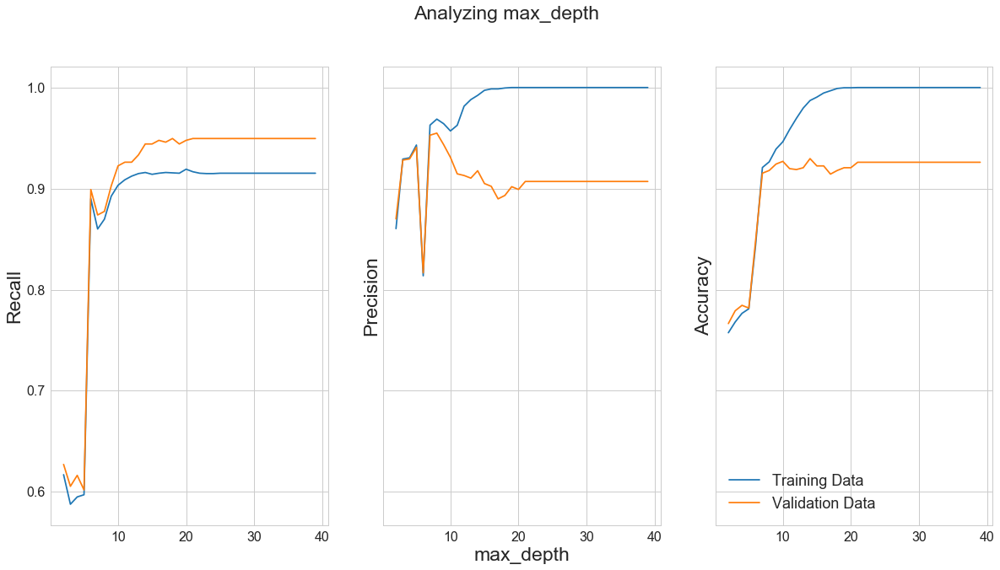

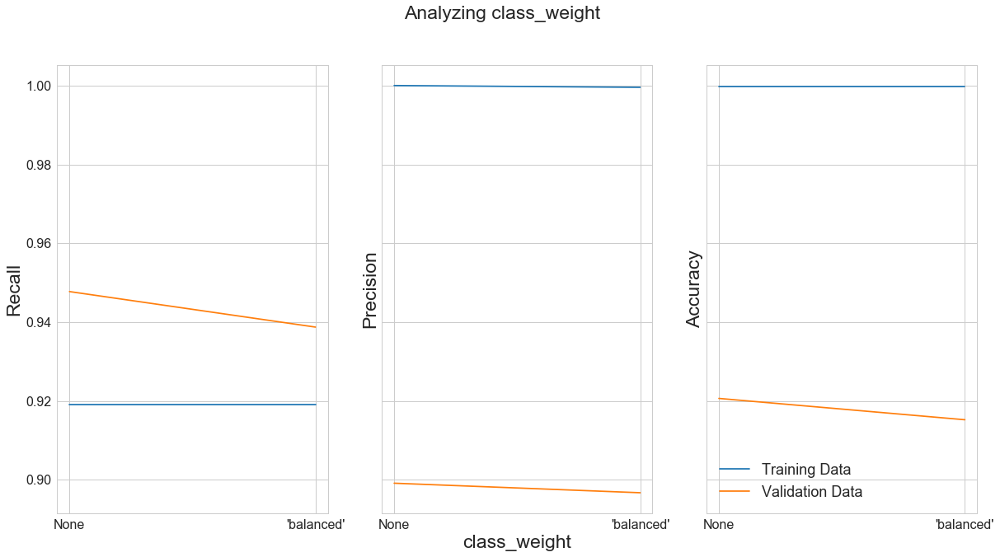

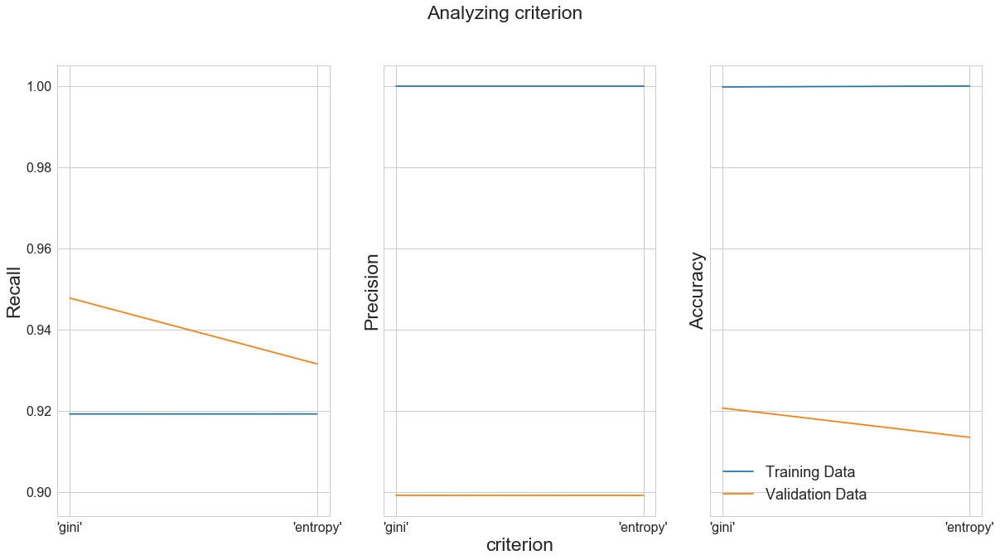

In [37]:
max_d2 = tuning2() 
# max_d = tunning(parameter="max_depth", values=list(range(17,22,1))) #18



# max_f2 = tuning2(model = "tree.DecisionTreeClassifier(max_depth = " + str(max_d2) 
# #                 + ", criterion = " + str(crit)  
#                 + " , ", parameter = "max_features", 
#                 values= [i/20 for i in list(range(1,21,1))])

# min_s2 = tuning2(model = "tree.DecisionTreeClassifier(max_depth = " + str(max_d2) 
# #                 + ", criterion = " + str(crit) 
#                 + ", max_features = " + str(max_f2) 
# #                 + ", max_leaf_nodes = " + str(max_l)
#                 + ", ", parameter = "min_samples_split", values= [i/20 for i in list(range(1,21,1))])

# max_l2 = tuning2(model = "tree.DecisionTreeClassifier(max_depth = " + str(max_d2) 
# #                 + ", criterion = " + str(crit) 
#                 + ", max_features = " + str(max_f2) 
# #                 + ", min_samples_split = " + str(min_s)
#                 + ", ", parameter = "max_leaf_nodes ", values=list(range(2,100,2)))

class_w2 = tuning2(model = "tree.DecisionTreeClassifier(max_depth = " + str(max_d2) 
#                   + ", criterion = " + str(crit) 
#                   + ", max_features = " + str(max_f) 
#                   + ", min_samples_split = " + str(min_s)
#                   + ", max_leaf_nodes = " + str(max_l2) 
                  + ", ", parameter = "class_weight", values=("None", "'balanced'"))

crit2 = tuning2(model = "tree.DecisionTreeClassifier(max_depth = " + str(max_d2) 
#                + ", max_features = " + str(max_f2) 
#                + ", min_samples_split = " + str(min_s)
#                + ", max_leaf_nodes = " + str(max_l) 
               + ", class_weight = " + str(class_w2)
               + ", ", parameter = "criterion", values=("'gini'", "'entropy'"))

In [38]:
print("The best parameters found for the model tree.DecisionTreeClassifier are: \nmax_depth = " 
      + str(max_d2) 
      + ", \ncriterion = " + str(crit2) 
# + ", \nmax_features = " + str(max_f2) 
# + ", \nmin_samples_split = "  + str(min_s) 
# + ", \nmax_leaf_nodes = " + str(max_l) 
+ "\nclass_weight = " + str(class_w2))

The best parameters found for the model tree.DecisionTreeClassifier are: 
max_depth = 20, 
criterion = 'entropy'
class_weight = None


After tuning based on the recall of the ‘yes’ class, the best hyperparameters found are:


The information below shows the classification report of the performance of this model and then the graph of the decision tree.


In [39]:
# clf_tree = eval(" tree.DecisionTreeClassifier(random_state=1, max_depth = " + str(max_d) 
#                 + ", criterion = " + str(crit) 
#                 + ", max_features = " + str(max_f) 
# #                 + ", min_samples_split = " + str(min_s) 
# #                 + ", max_leaf_nodes = " + str(max_l) 
#                 + ", class_weight = " + str(class_w) + ')')


# clf_tree = clf_tree.fit(X_train,y_train)

# y_pred_tree = clf_tree.predict(X_test)

clf_tree2 = eval(" tree.DecisionTreeClassifier(random_state=1, max_depth = " + str(max_d2) 
                + ", criterion = " + str(crit2) 
#                 + ", max_features = " + str(max_f2) 
#                 + ", min_samples_split = " + str(min_s2) 
#                 + ", max_leaf_nodes = " + str(max_l2) 
                + ", class_weight = " + str(class_w2) + ')')


clf_tree2 = clf_tree2.fit(X_train,y_train)

y_pred_tree2 = clf_tree2.predict(X_test)


print("Base Line Performance \n")

print(metrics.classification_report(y_test, y_pred_tree_base))

# print("Enhanced Performance \n")

# print(metrics.classification_report(y_test, y_pred_tree))

print("Enhanced Performance with cross-validation \n")

print(metrics.classification_report(y_test, y_pred_tree2))


Base Line Performance 

              precision    recall  f1-score   support

          no       0.91      0.89      0.90       693
         yes       0.90      0.91      0.90       693

   micro avg       0.90      0.90      0.90      1386
   macro avg       0.90      0.90      0.90      1386
weighted avg       0.90      0.90      0.90      1386

Enhanced Performance with cross-validation 

              precision    recall  f1-score   support

          no       0.91      0.91      0.91       693
         yes       0.91      0.90      0.91       693

   micro avg       0.91      0.91      0.91      1386
   macro avg       0.91      0.91      0.91      1386
weighted avg       0.91      0.91      0.91      1386



In [40]:
print(clf_tree_base.get_params)
print(clf_tree2.get_params)

<bound method BaseEstimator.get_params of DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=1,
            splitter='best')>
<bound method BaseEstimator.get_params of DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=20,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=1,
            splitter='best')>


In [41]:
df_tree=pd.concat((pd.DataFrame(X_test), pd.DataFrame(y_pred_tree2, columns=['y'])), axis=1)

In [42]:
dot_data = tree.export_graphviz(clf_tree2, out_file=None, 
                      feature_names=cols,  
                      class_names=list(set(y)),  
                      filled=True, rounded=True) 

features = list(X_train.columns)

dot_data = StringIO()  
export_graphviz(clf_tree2, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydot.graph_from_dot_data(dot_data.getvalue())  
Image(graph[0].create_png())

In [43]:
# clfffff=tree.DecisionTreeClassifier(random_state=1, max_depth = 2)
# clfffff = clfffff.fit(X_train,y_train)
print( "Baseline Tree attributes: \nMax Depth: " + str(clf_tree_base.tree_.max_depth)
     + "\nNode Count: " + str(clf_tree_base.tree_.node_count))

print( "\nTuned Tree attributes: \nMax Depth: " + str(clf_tree2.tree_.max_depth)
     + "\nNode Count: " + str(clf_tree2.tree_.node_count))


Baseline Tree attributes: 
Max Depth: 24
Node Count: 963

Tuned Tree attributes: 
Max Depth: 20
Node Count: 843


In [44]:
help(tree._tree.Tree)

Help on class Tree in module sklearn.tree._tree:

class Tree(builtins.object)
 |  Array-based representation of a binary decision tree.
 |  
 |  The binary tree is represented as a number of parallel arrays. The i-th
 |  element of each array holds information about the node `i`. Node 0 is the
 |  tree's root. You can find a detailed description of all arrays in
 |  `_tree.pxd`. NOTE: Some of the arrays only apply to either leaves or split
 |  nodes, resp. In this case the values of nodes of the other type are
 |  arbitrary!
 |  
 |  Attributes
 |  ----------
 |  node_count : int
 |      The number of nodes (internal nodes + leaves) in the tree.
 |  
 |  capacity : int
 |      The current capacity (i.e., size) of the arrays, which is at least as
 |      great as `node_count`.
 |  
 |  max_depth : int
 |      The maximal depth of the tree.
 |  
 |  children_left : array of int, shape [node_count]
 |      children_left[i] holds the node id of the left child of node i.
 |      For leaves,

#### Random Forest
Random forest classification is an estimator based on an ensemble of decision trees created with subsamples of the training data. Each tree generates its own decision and afterwards a consensus is made based on the average of the decisions of the different trees, hence the name "Random Forest" [14].
First, the baseline performance of the model is obtained by training the random forest with its default values.
The Table below shows the classification report of the performance of this model.

In [45]:
#Baseline Forest

clf_forest_base = RandomForestClassifier(random_state=1)
clf_forest_base = clf_forest_base.fit(X_train, y_train)

y_pred_forest_base = clf_forest_base.predict(X_test)

print(metrics.classification_report(y_test, y_pred_forest_base))

              precision    recall  f1-score   support

          no       0.91      0.96      0.94       693
         yes       0.96      0.91      0.93       693

   micro avg       0.94      0.94      0.94      1386
   macro avg       0.94      0.94      0.94      1386
weighted avg       0.94      0.94      0.94      1386



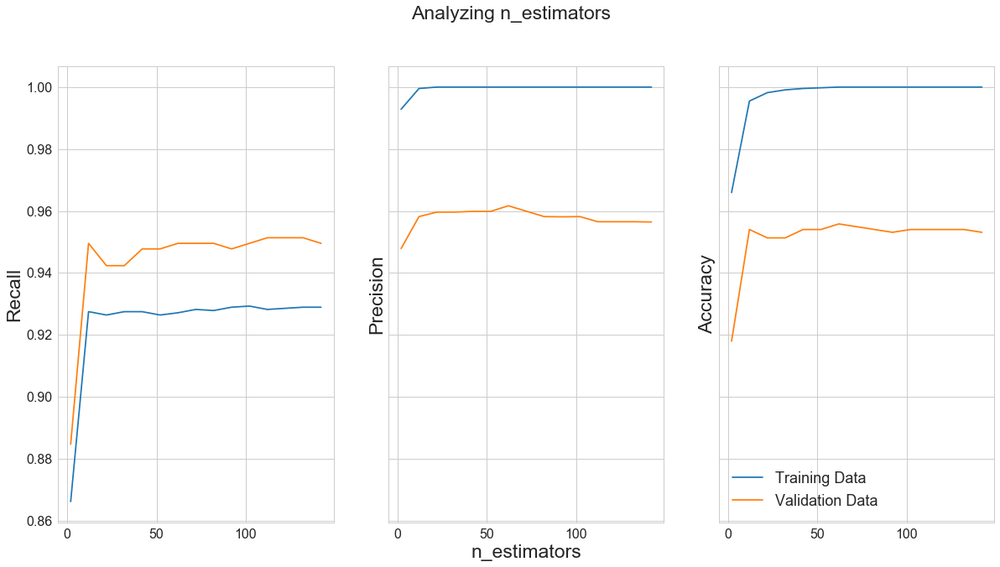

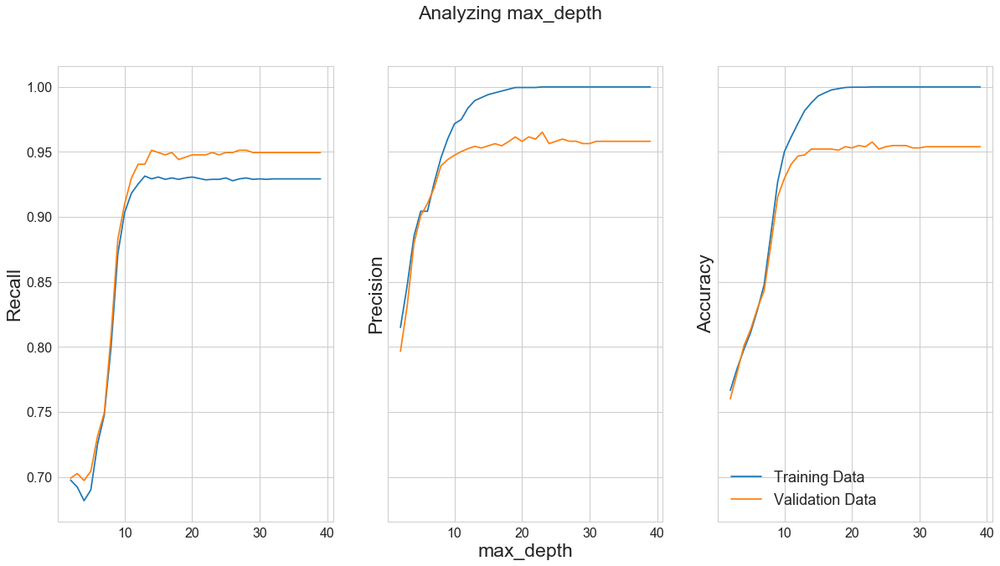

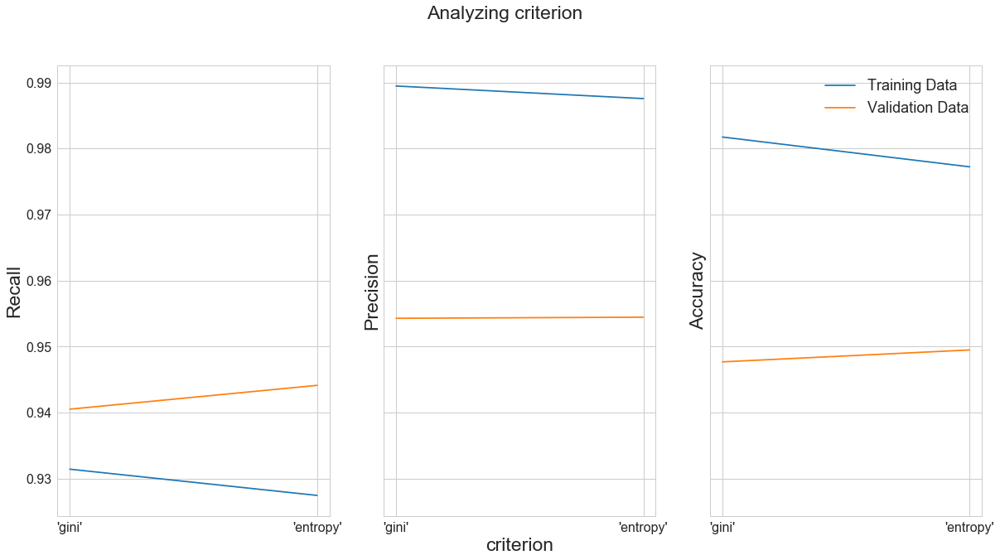

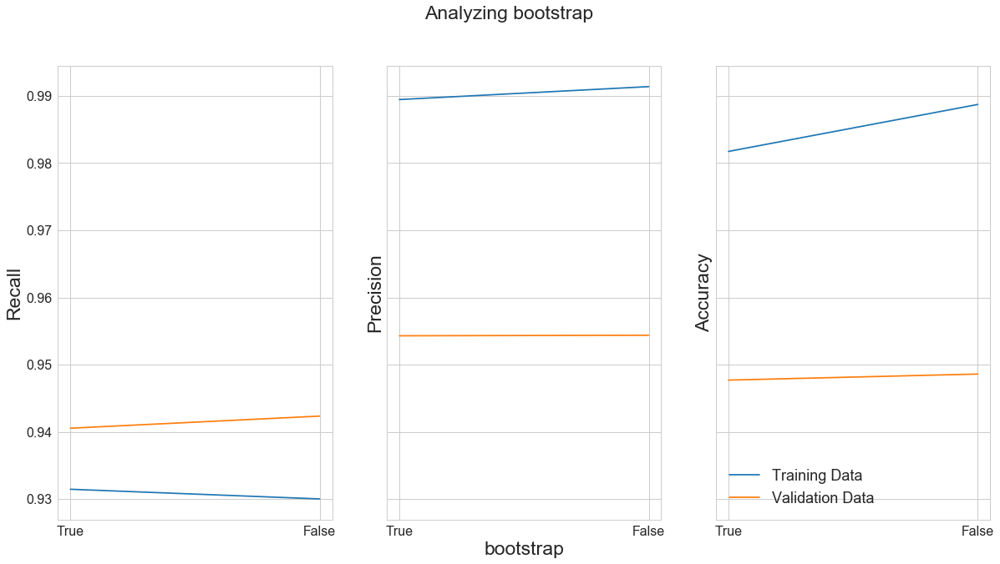

In [46]:
# n_e = tuning(model = "RandomForestClassifier(", 
#              parameter = "n_estimators", values = list(range(2,150,10)))


# max_de = tuning(model = "RandomForestClassifier(n_estimators=" + str(n_e) 
#                 + ", ", parameter = "max_depth", values = list(range(2,40,1)))

# cri = tuning(model = "RandomForestClassifier(n_estimators=" + str(n_e) 
#               + ", max_depth = " + str(max_de)
#               + ", ", parameter = "criterion", values=("'gini'", "'entropy'"))

# boot = tuning(model = "RandomForestClassifier(n_estimators=" + str(n_e) 
#               + ", max_depth = " + str(max_de)
#               + ", criterion = " + str(cri)
#               + ", ", parameter = "bootstrap", values=("True", "False"))




n_e2 = tuning2(model = "RandomForestClassifier(", 
             parameter = "n_estimators", values = list(range(2,150,10)))


max_de2 = tuning2(model = "RandomForestClassifier(n_estimators=" + str(n_e2) 
                + ", ", parameter = "max_depth", values = list(range(2,40,1)))

cri2 = tuning2(model = "RandomForestClassifier(n_estimators=" + str(n_e2) 
              + ", max_depth = " + str(max_de2)
              + ", ", parameter = "criterion", values=("'gini'", "'entropy'"))

boot2 = tuning2(model = "RandomForestClassifier(n_estimators=" + str(n_e2) 
              + ", max_depth = " + str(max_de2)
              + ", criterion = " + str(cri2)
              + ", ", parameter = "bootstrap", values=("True", "False"))



In [47]:
# print("The best parameters found for the RandomForestClassifier using validation are: \nmax_depth = " 
#       + str(max_de) 
#       + "\nn_estimators = " + str(n_e)
#       + ", \ncriterion = " + str(crit) 
# #       + ", \nmax_features = " + str(max_f) 
# #       + ", \nmin_samples_split = "  + str(min_s) 
# #       + ", \nmax_leaf_nodes = " + str(max_l) 
# #       + "\nclass_weight = " + str(class_w)
#       + "\nbootstrap = " + str(boot)
#      )

In [48]:
print("The best parameters found for the RandomForestClassifier using cross validation are: \nmax_depth = " 
      + str(max_de2) 
      + "\nn_estimators = " + str(n_e2)
      + ", \ncriterion = " + str(crit2) 
#       + ", \nmax_features = " + str(max_f) 
#       + ", \nmin_samples_split = "  + str(min_s) 
#       + ", \nmax_leaf_nodes = " + str(max_l) 
#       + "\nclass_weight = " + str(class_w)
      + "\nbootstrap = " + str(boot2)
     )

The best parameters found for the RandomForestClassifier using cross validation are: 
max_depth = 13
n_estimators = 102, 
criterion = 'entropy'
bootstrap = True


In [49]:
# clf_forest = eval("RandomForestClassifier(n_estimators = "+ str(n_e)
#                   + ", random_state=1, max_depth = " + str(max_de)
#                   + ", bootstrap =" + str(boot)
#                   + ", criterion = "+ str(cri)
#                  + ")")
# clf_forest = clf_forest.fit(X_train, y_train)

clf_forest2 = eval("RandomForestClassifier(n_estimators = "+ str(n_e2)
                  + ", random_state=1, max_depth = " + str(max_de2)
                  + ", bootstrap =" + str(boot2)
                  + ", criterion = "+ str(cri2)
                   + ")")
clf_forest2 = clf_forest2.fit(X_train, y_train)

# estimator 60
# max features 0.5
# mmin sample leaf 5


# y_pred_forest = clf_forest.predict(X_test)
y_pred_forest2 = clf_forest2.predict(X_test)

print("Base Line Performance \n")

print(metrics.classification_report(y_test, y_pred_forest_base))

# print("Enhanced Performance \n")

# print(metrics.classification_report(y_test, y_pred_forest))

print("Enhanced Performance with cross validation \n")

print(metrics.classification_report(y_test, y_pred_forest2))

Base Line Performance 

              precision    recall  f1-score   support

          no       0.91      0.96      0.94       693
         yes       0.96      0.91      0.93       693

   micro avg       0.94      0.94      0.94      1386
   macro avg       0.94      0.94      0.94      1386
weighted avg       0.94      0.94      0.94      1386

Enhanced Performance with cross validation 

              precision    recall  f1-score   support

          no       0.92      0.96      0.94       693
         yes       0.96      0.92      0.94       693

   micro avg       0.94      0.94      0.94      1386
   macro avg       0.94      0.94      0.94      1386
weighted avg       0.94      0.94      0.94      1386



In [50]:
print( "Baseline Tree attributes: \nNumber of Estimators: " + str(len(clf_forest_base.estimators_))+ "\n")

print( "Tunned Tree attributes: \nNumber of Estimators: " + str(len(clf_forest2.estimators_))+ "\n")


Baseline Tree attributes: 
Number of Estimators: 10

Tunned Tree attributes: 
Number of Estimators: 102



In [51]:
# help(tree._tree.Tree)

In [52]:
df_forest=pd.concat((pd.DataFrame(X_test), pd.DataFrame(y_pred_forest2, columns=['y'])), axis=1)

# !!!!!!!Conclusions of random forest

#### Neural Networks
A Neural network is an interconnected group of simple processing units that use mathematical models to process information. For the Neural Networks (NN) classifier, Scikit-learn’s application uses the Multi-layer Perceptron, which trains using backpropagation, specifically using a form of gradient descent calculated using backpropagation. For the classification of samples, it uses a Cross-Entropy loss function and tries to minimize it, returning a vector of probability estimates per sample [18]. Scikit-learn’s NN classifier also supports multi-class classification through the use of the normalized exponential function as the output function, which tries to normalize an input vector by diving its elements by the sum of the exponential of each of its elements, ensuring that the sums of the components of the output vector equals one [19]. Furthermore, this specific application of NN supports multi-label classification through the use of the logistic function [18].
There is not a standard methodology for tuning a neural network and therefore grid-search is a good tool to select the best hyperparameters. The grid_search function systematically works through multiple combinations of parameter values, cross validates them and determine which one gives the best performance


In [53]:
#Baseline Forest
clf_nn_base = MLPClassifier(random_state=1)
clf_nn_base = clf_nn_base.fit(X_train, y_train)

y_pred_nn_base = clf_nn_base.predict(X_test)

print(metrics.classification_report(y_test, y_pred_nn_base))


              precision    recall  f1-score   support

          no       0.92      0.92      0.92       693
         yes       0.92      0.92      0.92       693

   micro avg       0.92      0.92      0.92      1386
   macro avg       0.92      0.92      0.92      1386
weighted avg       0.92      0.92      0.92      1386



In [54]:
clf_nn_base.get_params

<bound method BaseEstimator.get_params of MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(100,), learning_rate='constant',
       learning_rate_init=0.001, max_iter=200, momentum=0.9,
       n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
       random_state=1, shuffle=True, solver='adam', tol=0.0001,
       validation_fraction=0.1, verbose=False, warm_start=False)>

In [55]:
print("The hidden layer size should be:")
print("Between the input layer size " + str(X_train.shape[1]) 
      + " and the output layer size " + str(len(set(y_test))))
print("Around " + str(2/3*(X_train.shape[1]+len(set(y_test)))))
print("less than " + str(2*X_train.shape[1]))

The hidden layer size should be:
Between the input layer size 54 and the output layer size 2
Around 37.33333333333333
less than 108


In [56]:
param_grid = {
    'hidden_layer_sizes': [(x*10)for x in range(1,12)],
    'activation': ['identity', 'logistic', 'tanh', 'relu'],
    'solver' : ['adam','lbfgs', 'sgd']
}

mapping = {'yes':1, 'no': 0}
y_temp = pd.Series(y_train)
y_temp = y_temp.map(mapping)

gs = GridSearchCV(MLPClassifier(random_state=1), param_grid, cv = 5,
                  scoring = 'recall', n_jobs = -2)
gs.fit(X_train, y_temp)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(100,), learning_rate='constant',
       learning_rate_init=0.001, max_iter=200, momentum=0.9,
       n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
       random_state=1, shuffle=True, solver='adam', tol=0.0001,
       validation_fraction=0.1, verbose=False, warm_start=False),
       fit_params=None, iid='warn', n_jobs=-2,
       param_grid={'hidden_layer_sizes': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110], 'activation': ['identity', 'logistic', 'tanh', 'relu'], 'solver': ['adam', 'lbfgs', 'sgd']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=0)

In [57]:
y_test_temp = pd.Series(y_test).map(mapping)

print("Best parameters found: \n", gs.best_params_)
clf_nn = gs.best_estimator_
clf_nn.score(X_test, y_test_temp)

Best parameters found: 
 {'activation': 'logistic', 'hidden_layer_sizes': 50, 'solver': 'lbfgs'}


0.9199134199134199

In [58]:
param_grid2 = {
    'hidden_layer_sizes': list(range(40,60)),
    'activation': ['identity', 'logistic', 'tanh', 'relu'],
    'solver' : ['adam','lbfgs', 'sgd']
}

mapping = {'yes':1, 'no': 0}
y_temp = pd.Series(y_train)
y_temp = y_temp.map(mapping)

gs2 = GridSearchCV(MLPClassifier(random_state=1), param_grid2, cv = 5,
                  scoring = 'recall', n_jobs = -2)
gs2.fit(X_train, y_temp)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(100,), learning_rate='constant',
       learning_rate_init=0.001, max_iter=200, momentum=0.9,
       n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
       random_state=1, shuffle=True, solver='adam', tol=0.0001,
       validation_fraction=0.1, verbose=False, warm_start=False),
       fit_params=None, iid='warn', n_jobs=-2,
       param_grid={'hidden_layer_sizes': [40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59], 'activation': ['identity', 'logistic', 'tanh', 'relu'], 'solver': ['adam', 'lbfgs', 'sgd']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=0)

In [59]:
y_test_temp = pd.Series(y_test).map(mapping)

print("Best parameters found: \n", gs2.best_params_)

clf_nn2 = gs2.best_estimator_
print(clf_nn2.score(X_test, y_test_temp))

param_grid2

Best parameters found: 
 {'activation': 'logistic', 'hidden_layer_sizes': 42, 'solver': 'lbfgs'}
0.9148629148629148


{'hidden_layer_sizes': [40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59],
 'activation': ['identity', 'logistic', 'tanh', 'relu'],
 'solver': ['adam', 'lbfgs', 'sgd']}

In [60]:
# estimator 60
# max features 0.5
# mmin sample leaf 5
y_pred_nn = clf_nn.predict(X_test)

y_pred_nn2 = clf_nn2.predict(X_test)

print("Base Line Performance \n")

print(metrics.classification_report(y_test, y_pred_nn_base))


print("Enhanced Performance with GridSearchCV and Cross Validation \n")

print(metrics.classification_report(y_test_temp, y_pred_nn2))

Base Line Performance 

              precision    recall  f1-score   support

          no       0.92      0.92      0.92       693
         yes       0.92      0.92      0.92       693

   micro avg       0.92      0.92      0.92      1386
   macro avg       0.92      0.92      0.92      1386
weighted avg       0.92      0.92      0.92      1386

Enhanced Performance with GridSearchCV and Cross Validation 

              precision    recall  f1-score   support

           0       0.91      0.92      0.92       693
           1       0.92      0.91      0.91       693

   micro avg       0.91      0.91      0.91      1386
   macro avg       0.91      0.91      0.91      1386
weighted avg       0.91      0.91      0.91      1386



In [61]:
print(clf_nn_base.get_params)
print(clf_nn.get_params)

<bound method BaseEstimator.get_params of MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(100,), learning_rate='constant',
       learning_rate_init=0.001, max_iter=200, momentum=0.9,
       n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
       random_state=1, shuffle=True, solver='adam', tol=0.0001,
       validation_fraction=0.1, verbose=False, warm_start=False)>
<bound method BaseEstimator.get_params of MLPClassifier(activation='logistic', alpha=0.0001, batch_size='auto',
       beta_1=0.9, beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=50, learning_rate='constant',
       learning_rate_init=0.001, max_iter=200, momentum=0.9,
       n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
       random_state=1, shuffle=True, solver='lbfgs', tol=0.0001,
       validation_fraction=0.1, verbose=False, warm_start=False)>


In [62]:
df_nn=pd.concat((pd.DataFrame(X_test), pd.DataFrame(pd.Series(y_pred_nn2).map({1:'yes', 0:'no'}), columns=['y'])), axis=1)

#### 4. Create a few plots of your model on the test data, two of the data dimensions at a time, indicating the predicted elements of each class using diferent colors or shapes. You may need to try plotting various pairs of dimensions to see which provide some interesting result. Be sure to label your axis and legend. Why is separation better on some plots than others?

In [63]:
# Chosen classifiers
#clf_tree2 - df_tree
#clf_forest2 - df_forest
#clf_nn2 - df_nn


# pplot_tree = sns.pairplot(df_tree, hue = 'y')
# pplot_tree.savefig('pplot_tree.png')



def plt_creation(df, xplot_val, yplot_val, class_val, ax=None):
    pp = sns.scatterplot(x=xplot_val, y=yplot_val, data=df, hue=class_val,
                         style=class_val, palette={"no": "blue", "yes": "orange"},
                    alpha=0.7, ax=ax)
    


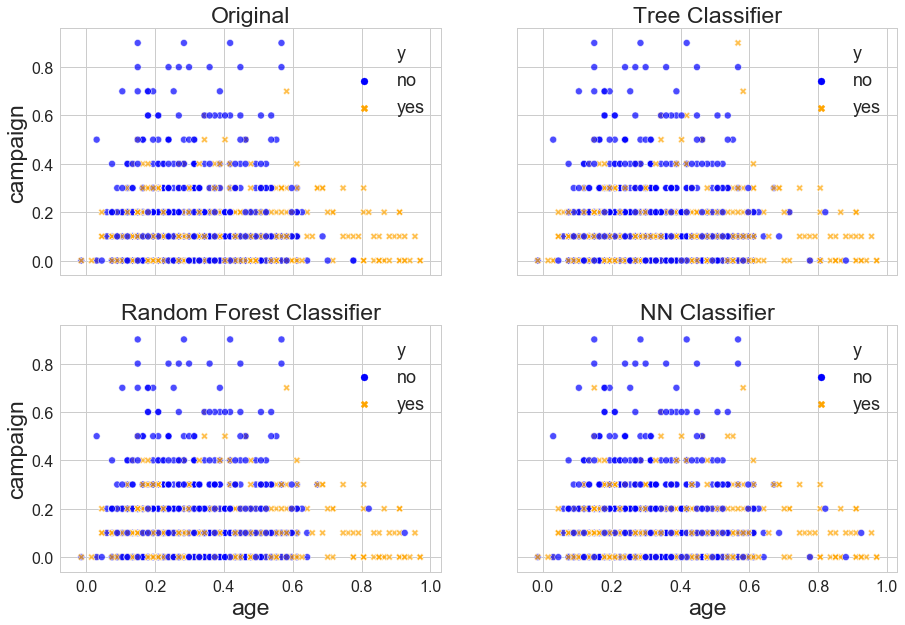

In [64]:
df_original = pd.concat((pd.DataFrame(X_test), pd.DataFrame(y_test, columns=['y'])), axis=1)

fig, ax = plt.subplots(2,2, figsize=(15,10), sharey=True, sharex = True)
ax[0,0].set_title('Original')
ax[0,1].set_title('Tree Classifier')
ax[1,0].set_title('Random Forest Classifier')
ax[1,1].set_title('NN Classifier')

plt_creation(df_original,'age', 'campaign', 'y', ax=ax[0,0])
plt_creation(df_tree,'age', 'campaign', 'y', ax=ax[0,1])
plt_creation(df_forest,'age', 'campaign', 'y', ax=ax[1,0])
plt_creation(df_nn,'age', 'campaign', 'y', ax=ax[1,1])

It seems that even if there is no clear distinction between the different classes of the dataset, it is possible to discern in some of the pair of variables a slight separation. In the campaign and age plot, for example, it is possible to separate some values of "no" from the majority of the "yes" class if an horizontal line is traced through 0.4 or 0.6 of campaign. A vertical line through 0.7 or 0.8 of age would also separate some values of the "yes" class.

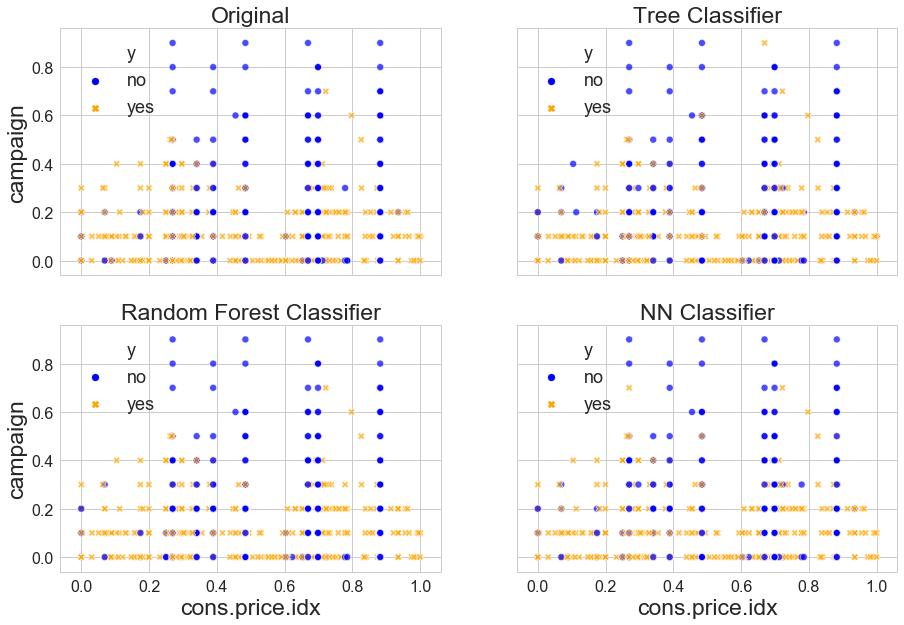

In [65]:
fig, ax = plt.subplots(2,2, figsize=(15,10), sharey=True, sharex = True)
ax[0,0].set_title('Original')
ax[0,1].set_title('Tree Classifier')
ax[1,0].set_title('Random Forest Classifier')
ax[1,1].set_title('NN Classifier')

plt_creation(df_original,'cons.price.idx', 'campaign', 'y', ax=ax[0,0])
plt_creation(df_tree,'cons.price.idx', 'campaign', 'y', ax=ax[0,1])
plt_creation(df_forest,'cons.price.idx', 'campaign', 'y', ax=ax[1,0])
plt_creation(df_nn,'cons.price.idx', 'campaign', 'y', ax=ax[1,1])

For the campaign and cons.price.idx plot, it is also possible to separate some "no" values from the rest by tracing a horizontal line through 0.6 of campaign. Nonetheless, for this instance it is not possible to trace a vertical line as in the previous plot.

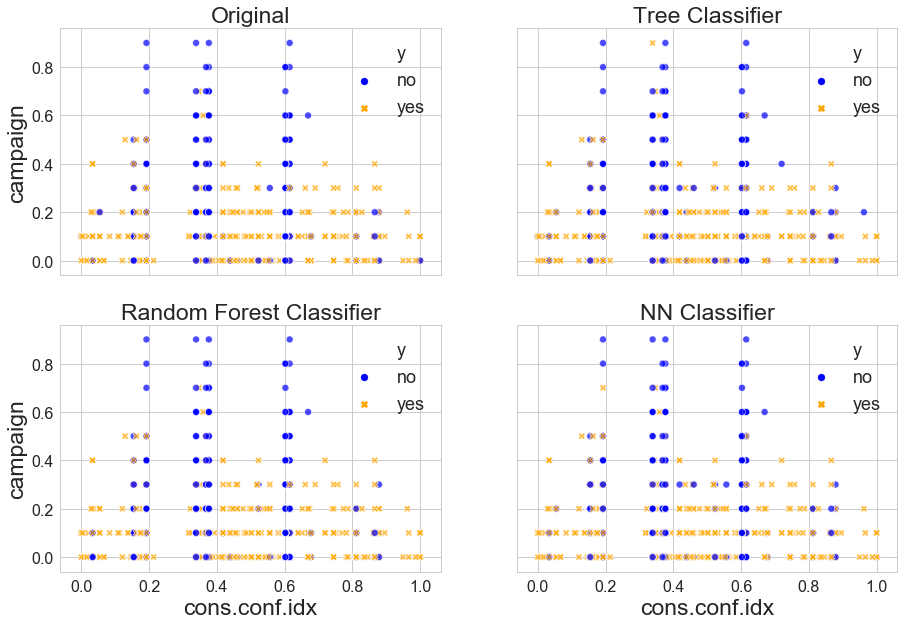

In [66]:
fig, ax = plt.subplots(2,2, figsize=(15,10), sharey=True, sharex = True)
ax[0,0].set_title('Original')
ax[0,1].set_title('Tree Classifier')
ax[1,0].set_title('Random Forest Classifier')
ax[1,1].set_title('NN Classifier')

plt_creation(df_original,'cons.conf.idx', 'campaign', 'y', ax=ax[0,0])
plt_creation(df_tree,'cons.conf.idx', 'campaign', 'y', ax=ax[0,1])
plt_creation(df_forest,'cons.conf.idx', 'campaign', 'y', ax=ax[1,0])
plt_creation(df_nn,'cons.conf.idx', 'campaign', 'y', ax=ax[1,1])

For this third case, it seems it is not possible to trace a vertical line similar to the first plot, but it seems it is possible to trace a diagonal line that goes from campaign=0.6 and cons.conf.idx=0 to campaign=0.2 and cons.conf.dix=1.0, separating some "no" values from the rest.

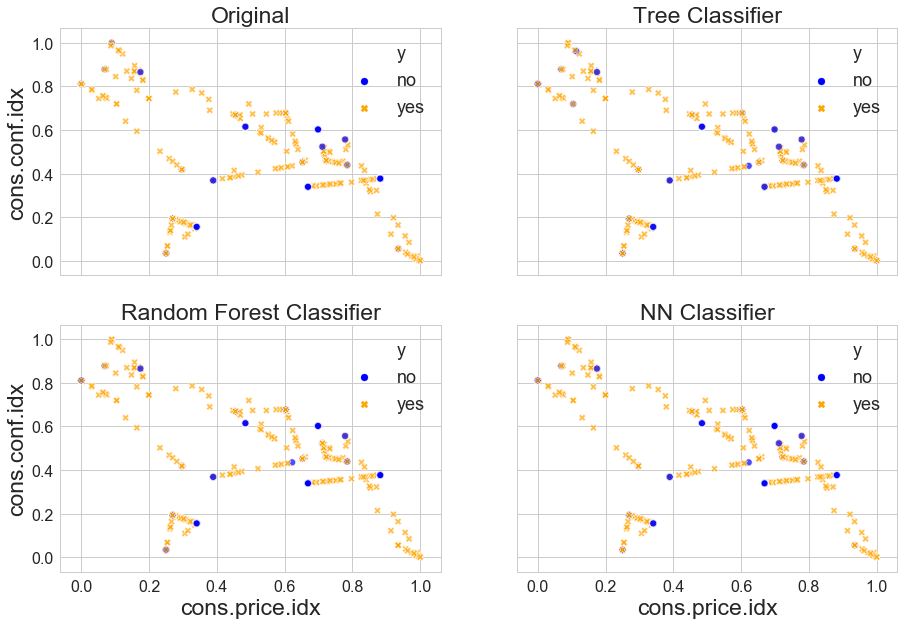

In [67]:
fig, ax = plt.subplots(2,2, figsize=(15,10), sharey=True, sharex = True)
ax[0,0].set_title('Original')
ax[0,1].set_title('Tree Classifier')
ax[1,0].set_title('Random Forest Classifier')
ax[1,1].set_title('NN Classifier')

plt_creation(df_original,'cons.price.idx', 'cons.conf.idx', 'y', ax=ax[0,0])
plt_creation(df_tree,'cons.price.idx', 'cons.conf.idx', 'y', ax=ax[0,1])
plt_creation(df_forest,'cons.price.idx', 'cons.conf.idx', 'y', ax=ax[1,0])
plt_creation(df_nn,'cons.price.idx', 'cons.conf.idx', 'y', ax=ax[1,1])

In this fourth case, it can be seen that the "no" class is more concentrated in some particular values of con.price.idx and cons.conf.idx. It seems that it is not possible to separate them using a straight line between a pair of coordinates, nonetheless the two outcomes seem to be discriminable using non-linear boundaries.
It can be seen that the separation is better in some plots than in others because some attributes have a bigger influence in the class prediction than others, making them better at making a distinction between the outputs.

#### 5. Produce a table with the true/false positive/negative metrics as well as accuracies. Compare the values using bar charts. HINT: classification report from sklearn.metrics

In [68]:
# Evaluating Decision Tree
print("The results of the decision tree model are " + "\n" + " 'no'  'yes'")
print(metrics.confusion_matrix(y_test, y_pred_tree2))
print(metrics.classification_report(y_test, y_pred_tree2))

# Evaluating Random Forest
print("The results of the random forest model are " + "\n" + " 'no'  'yes'")
print(metrics.confusion_matrix(y_test, y_pred_forest2))
print(metrics.classification_report(y_test, y_pred_forest2))

# Evaluating Neural Netoworks
print("The results of the neural networks model are " + "\n" + " 'no'  'yes'")
print(metrics.confusion_matrix(y_test_temp, y_pred_nn2))
print(metrics.classification_report(y_test_temp, y_pred_nn2))

The results of the decision tree model are 
 'no'  'yes'
[[633  60]
 [ 66 627]]
              precision    recall  f1-score   support

          no       0.91      0.91      0.91       693
         yes       0.91      0.90      0.91       693

   micro avg       0.91      0.91      0.91      1386
   macro avg       0.91      0.91      0.91      1386
weighted avg       0.91      0.91      0.91      1386

The results of the random forest model are 
 'no'  'yes'
[[665  28]
 [ 57 636]]
              precision    recall  f1-score   support

          no       0.92      0.96      0.94       693
         yes       0.96      0.92      0.94       693

   micro avg       0.94      0.94      0.94      1386
   macro avg       0.94      0.94      0.94      1386
weighted avg       0.94      0.94      0.94      1386

The results of the neural networks model are 
 'no'  'yes'
[[636  57]
 [ 61 632]]
              precision    recall  f1-score   support

           0       0.91      0.92      0.92      

In [69]:
# Chosen classifiers
#clf_tree2 - df_tree
#clf_forest2 - df_forest
#clf_nn2 - df-nn
class_report_tree = metrics.classification_report(y_test, y_pred_tree2, output_dict = True)
class_report_forest = metrics.classification_report(y_test, y_pred_forest2, output_dict = True)
class_report_nn = metrics.classification_report(y_test_temp, y_pred_nn2, output_dict = True)

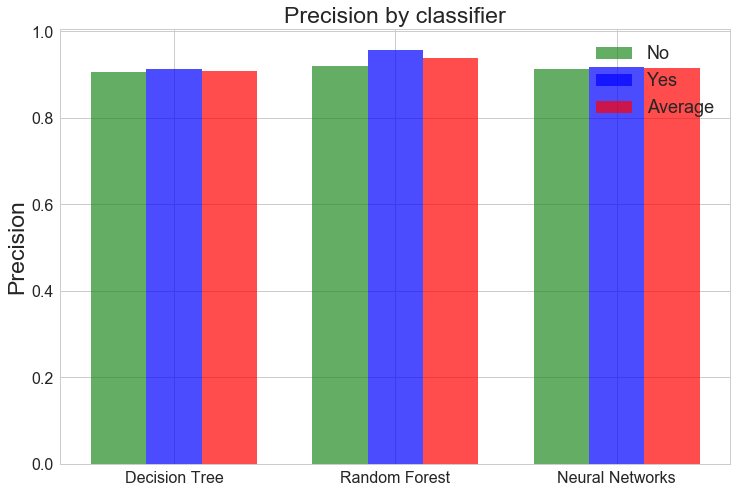

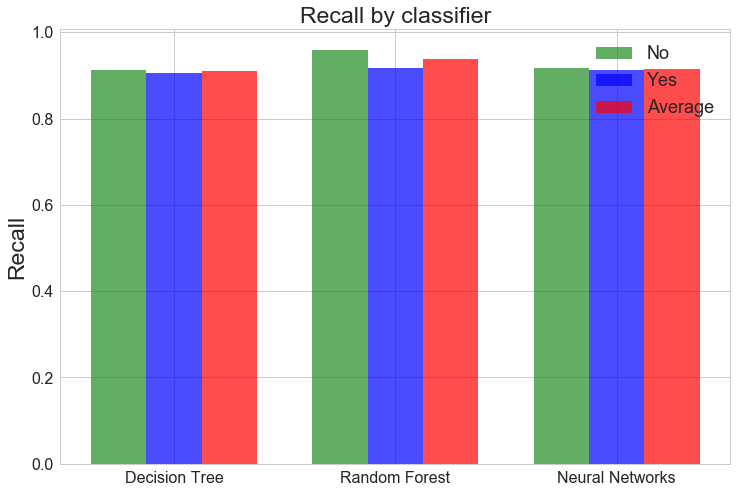

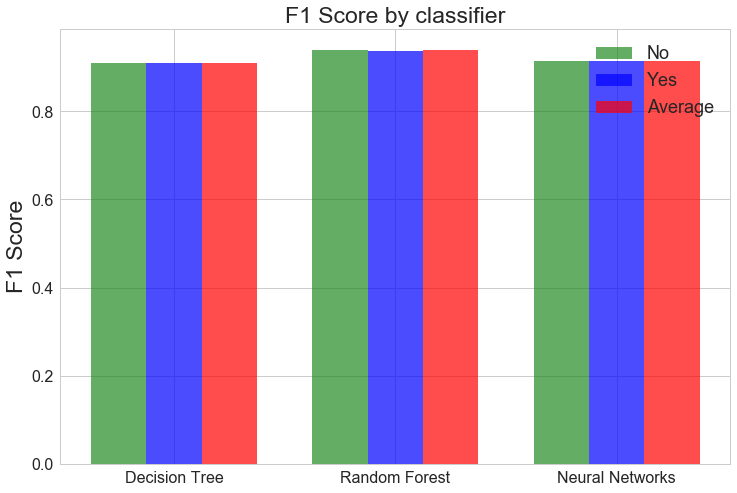

In [70]:
# reports = [class_report_tree, class_report_forest, class_report_nn]

reports = [class_report_tree, class_report_forest]
precision_no = []
precision_yes = []
precision_average = []

recall_no = []
recall_yes = []
recall_average = []

f1_score_no = []
f1_score_yes = []
f1_score_average = []

list(class_report_tree.keys())

for report in reports:
    precision_no.append(report['no']['precision'])
    precision_yes.append(report['yes']['precision'])
    precision_average.append(report['micro avg']['precision'])
    
    recall_no.append(report['no']['recall'])
    recall_yes.append(report['yes']['recall'])
    recall_average.append(report['micro avg']['recall'])
    
    f1_score_no.append(report['no']['f1-score'])
    f1_score_yes.append(report['yes']['f1-score'])
    f1_score_average.append(report['micro avg']['f1-score']) 
    
report = class_report_nn  
precision_no.append(report['0']['precision'])
precision_yes.append(report['1']['precision'])
precision_average.append(report['micro avg']['precision'])

recall_no.append(report['0']['recall'])
recall_yes.append(report['1']['recall'])
recall_average.append(report['micro avg']['recall'])

f1_score_no.append(report['0']['f1-score'])
f1_score_yes.append(report['1']['f1-score'])
f1_score_average.append(report['micro avg']['f1-score']) 


names = ["Decision Tree", "Random Forest", "Neural Networks"]
col={"yes":'forestgreen', "no":'blue', "average":'red'}
alph=0.7

ind = np.arange(3)  # the x locations for the groups
width = 0.5  # the width of the bars

fig, ax = plt.subplots(figsize=(12,8))
rects1 = ax.bar(ind - width/2, precision_no , width/2,
                color=col['yes'], label='No', alpha=alph)
rects2 = ax.bar(ind, precision_yes, width/2,
                color=col['no'], label='Yes', alpha=alph)
rects2 = ax.bar(ind + width/2 , precision_average, width/2,
                color=col['average'], label='Average', alpha=alph)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Precision')
ax.set_title('Precision by classifier')
ax.set_xticks(ind)
ax.set_xticklabels(names)
ax.legend(loc='best')

fig, ax = plt.subplots(figsize=(12,8))
rects1 = ax.bar(ind - width/2, recall_no , width/2, color=col['yes'], label='No', alpha=alph)
rects2 = ax.bar(ind, recall_yes, width/2, color=col['no'], label='Yes', alpha=alph)
rects2 = ax.bar(ind + width/2 , recall_average, width/2, color=col['average'], label='Average', alpha=alph)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Recall')
ax.set_title('Recall by classifier')
ax.set_xticks(ind)
ax.set_xticklabels(names)
ax.legend(loc='best')

fig, ax = plt.subplots(figsize=(12,8))
rects1 = ax.bar(ind - width/2, f1_score_no , width/2, color=col['yes'], label='No', alpha=alph)
rects2 = ax.bar(ind, f1_score_yes, width/2, color=col['no'], label='Yes', alpha=alph)
rects2 = ax.bar(ind + width/2 , f1_score_average, width/2, color=col['average'], label='Average', alpha=alph)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('F1 Score')
ax.set_title('F1 Score by classifier')
ax.set_xticks(ind)
ax.set_xticklabels(names)
ax.legend(loc='best')

plt.show()

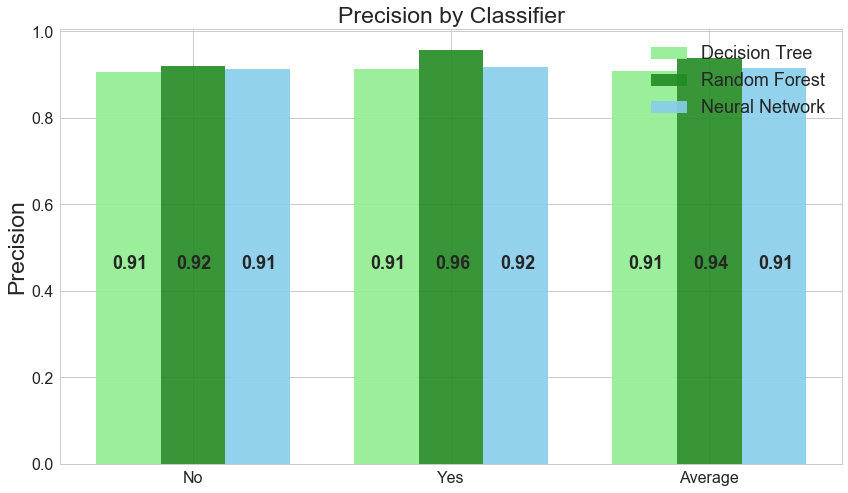

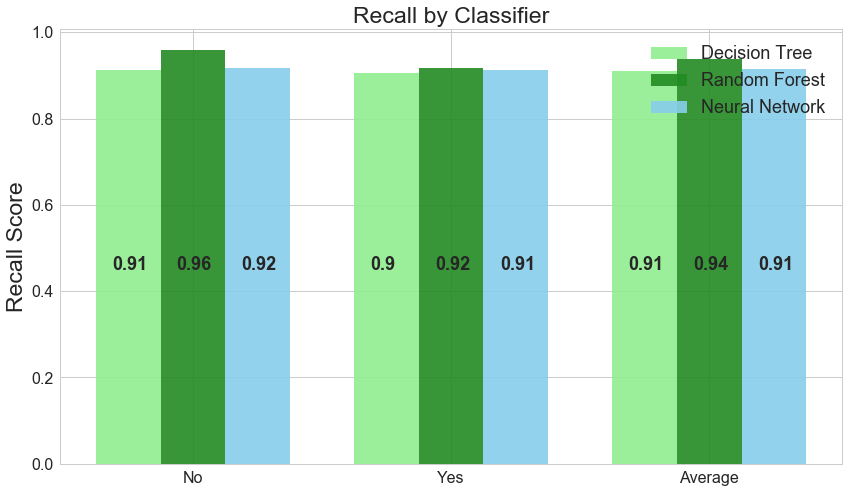

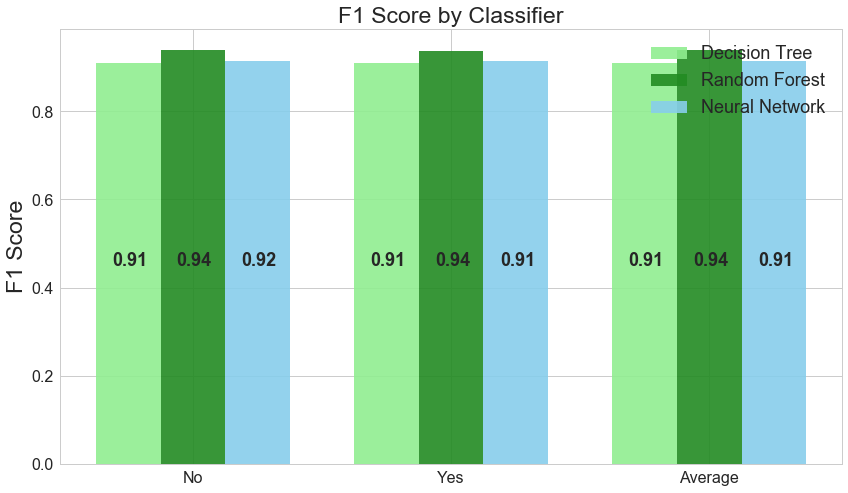

In [71]:
precisions = [[],[],[]]
recalls = [[],[],[]]
f1_scores = [[],[],[]]

reports = [class_report_tree, class_report_forest]

classes = ['no', 'yes', 'micro avg']



i = 0
for report in reports:
    for clas in classes:
        precisions[i].append(report[clas]['precision'])
        recalls[i].append(report[clas]['recall'])
        f1_scores[i].append(report[clas]['f1-score'])
    i = i + 1


report = class_report_nn
items = ['0', '1', 'micro avg']
for item in items:
    precisions[2].append(report[item]['precision'])
    recalls[2].append(report[item]['recall'])
    f1_scores[2].append(report[item]['f1-score'])
    


names= ['No', 'Yes', 'Average']
col={"Decision Tree":'lightgreen', "Random Forest":'forestgreen', "Neural Network":'skyblue'}
alph=0.9
ind = np.arange(3)  # the x locations for the groups
width = 0.5  # the width of the bars
txt_font_size=18

fig, ax = plt.subplots(figsize=(14,8))
rects1 = ax.bar(ind - width/2, precisions[0] , width/2, label='Decision Tree', color = col['Decision Tree'], alpha=alph)
rects2 = ax.bar(ind, precisions[1] , width/2, label='Random Forest', color = col['Random Forest'], alpha=alph)
rects3 = ax.bar(ind + width/2 , precisions[2] , width/2, label='Neural Network', color = col['Neural Network'], alpha=alph)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Precision')
ax.set_title('Precision by Classifier')
ax.set_xticks(ind)
ax.set_xticklabels(names)
ax.legend(loc='best')
for i in range(3):
    ax.text(i - width/1.6, 0.45, str(round(precisions[0][i],2)), fontweight='bold', fontsize=txt_font_size)
    ax.text(i - width/8, 0.45, str(round(precisions[1][i],2)), fontweight='bold', fontsize=txt_font_size)
    ax.text(i + width/2.65, 0.45, str(round(precisions[2][i],2)), fontweight='bold', fontsize=txt_font_size)



fig, ax = plt.subplots(figsize=(14,8))
rects1 = ax.bar(ind - width/2, recalls[0] , width/2, label='Decision Tree', color = col['Decision Tree'], alpha=alph)
rects2 = ax.bar(ind, recalls[1] , width/2, label='Random Forest', color = col['Random Forest'], alpha=alph)
rects3 = ax.bar(ind + width/2 , recalls[2] , width/2, label='Neural Network', color = col['Neural Network'], alpha=alph)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Recall Score')
ax.set_title('Recall by Classifier')
ax.set_xticks(ind)
ax.set_xticklabels(names)
ax.legend(loc='best')
for i in range(3):
    ax.text(i - width/1.6, 0.45, str(round(recalls[0][i],2)), fontweight='bold', fontsize=txt_font_size)
    ax.text(i - width/8, 0.45, str(round(recalls[1][i],2)), fontweight='bold', fontsize=txt_font_size)
    ax.text(i + width/2.65, 0.45, str(round(recalls[2][i],2)), fontweight='bold', fontsize=txt_font_size)


fig, ax = plt.subplots(figsize=(14,8))
rects1 = ax.bar(ind - width/2, f1_scores[0] , width/2, label='Decision Tree', color = col['Decision Tree'], alpha=alph)
rects2 = ax.bar(ind, f1_scores[1] , width/2, label='Random Forest', color = col['Random Forest'], alpha=alph)
rects3 = ax.bar(ind + width/2 , f1_scores[2] , width/2, label='Neural Network', color = col['Neural Network'], alpha=alph)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('F1 Score')
ax.set_title('F1 Score by Classifier')
ax.set_xticks(ind)
ax.set_xticklabels(names)
ax.legend(loc='best')
for i in range(3):
    ax.text(i - width/1.6, 0.45, str(round(f1_scores[0][i],2)), fontweight='bold', fontsize=txt_font_size)
    ax.text(i - width/8, 0.45, str(round(f1_scores[1][i],2)), fontweight='bold', fontsize=txt_font_size)
    ax.text(i + width/2.65, 0.45, str(round(f1_scores[2][i],2)), fontweight='bold', fontsize=txt_font_size)
    
plt.show()

# precisions

In [72]:
confusion_matrix_tree = metrics.confusion_matrix(y_test, y_pred_tree2)
confusion_matrix_forest = metrics.confusion_matrix(y_test, y_pred_forest2)
confusion_matrix_nn = metrics.confusion_matrix(y_test_temp, y_pred_nn2)
cms = [confusion_matrix_tree, confusion_matrix_forest, confusion_matrix_nn]
confusion_matrix_tree

array([[633,  60],
       [ 66, 627]], dtype=int64)

In [73]:
true_negative2 = [0,0,0]
false_negative2 = [0,0,0]
false_positive2 = [0,0,0]
true_positive2 = [0,0,0]

true_negative = []
false_negative = []
false_positive = []
true_positive = []

    
# print(metrics.index(true_negative))

clf_metrics = [true_negative, false_negative, false_positive, true_positive]
clf_metrics2 = [true_negative2, false_negative2, false_positive2, true_positive2]

start_time = timeit.default_timer()
i = 0
for cm in cms:
    true_negative2[i] = cm[0][0]
    false_negative2[i] = cm[1][0]
    false_positive2[i] = cm[0][1]
    true_positive2[i] = cm[1][1]
    i = i + 1
elapsed2 = timeit.default_timer() - start_time

start_time = timeit.default_timer()
for cm in cms:
    for metric in clf_metrics:
        metric.append(cm[clf_metrics.index(metric)%2][int(clf_metrics.index(metric)/2)])
elapsed = timeit.default_timer() - start_time          

print(elapsed)
print(clf_metrics)

print(elapsed2)
print(clf_metrics2)

# cms.index(confusion_matrix_tree)
# cms.index(confusion_matrix_tree)

6.290000010267249e-05
[[633, 665, 636], [66, 57, 61], [60, 28, 57], [627, 636, 632]]
8.009999999103457e-05
[[633, 665, 636], [66, 57, 61], [60, 28, 57], [627, 636, 632]]


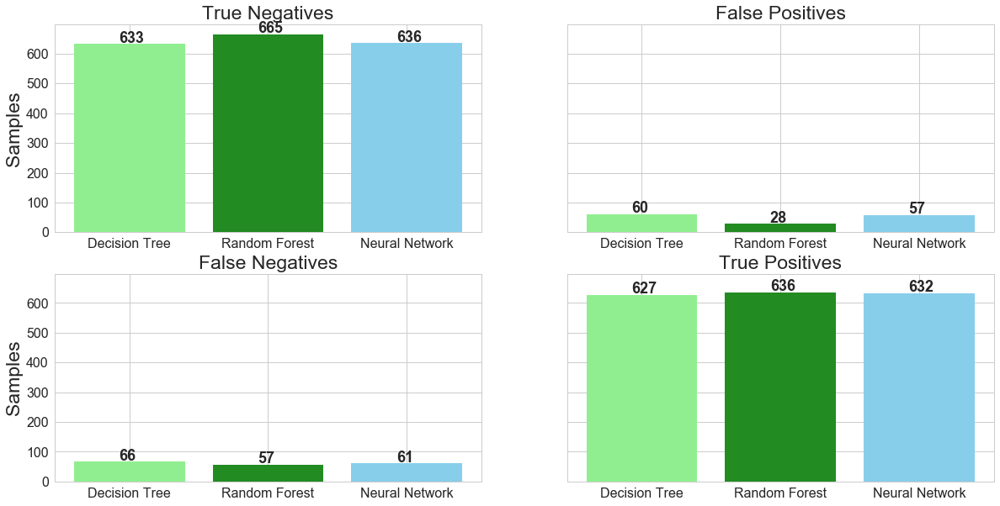

In [74]:
# fig, ax = plt.subplots(2,2, sharey=True, figsize=(20,10))
# names = ["Decision Tree", "Random Forest", "Neural Network"]
# col=['lightgreen', 'forestgreen', 'skyblue']
# alph=0.9
# # c= ['g','c','r']
# #True negatives
# ax[0,0].bar(names, clf_metrics[0], color = col)
# ax[0,0].set_ylabel('Samples')
# ax[0,0].set_title('True Negatives')
# for i in range(3):
#     ax[0,0].text(i-.075, clf_metrics[0][i]+5, str(clf_metrics[0][i]), fontweight='bold')
# #False negatives
# ax[1,0].bar(names, clf_metrics[1], color = col)
# ax[1,0].set_ylabel('Samples')
# ax[1,0].set_title('False Negatives')
# for i in range(3):
#     ax[1,0].text(i-.075, clf_metrics[1][i]+5, str(clf_metrics[1][i]), fontweight='bold')
# #False positives
# ax[0,1].bar(names, clf_metrics[2], color = col)
# ax[0,1].set_title('False Positives')
# for i in range(3):
#     ax[0,1].text(i-.075, clf_metrics[2][i]+5, str(clf_metrics[2][i]), fontweight='bold')
# #True positives
# ax[1,1].bar(names, clf_metrics[3], color = col)
# ax[1,1].set_title('True Positives')
# for i in range(3):
#     ax[1,1].text(i-.075, clf_metrics[3][i]+5, str(clf_metrics[3][i]), fontweight='bold')
    
    
#Create the subplot
fig, ax = plt.subplots(2,2, sharey=True, figsize=(20,10))
names = ["Decision Tree", "Random Forest", "Neural Network"]
col=['lightgreen', 'forestgreen', 'skyblue']
alph=0.9
txt_font_size = 18
#Write the value for each bar in the barplot, at its top
count=0
for i in range(2):
    for j in range(2):
        ax[j,i].bar(names, clf_metrics[count], color = col)
        for k in range(3):
            ax[j,i].text(k - .075, clf_metrics[count][k]+5, str(clf_metrics[count][k]),
                         fontweight='bold', fontsize=txt_font_size)
        count=count+1
ax[0,0].set_ylabel('Samples')
ax[0,0].set_title('True Negatives')
ax[1,0].set_ylabel('Samples')
ax[1,0].set_title('False Negatives')
ax[0,1].set_title('False Positives')
ax[1,1].set_title('True Positives')

ax[0,0].set_ylim()
plt.show()

6. Provide a short explanation of the results you have shown and what it means. Which classification method performed better? Why? Contrast performance with classification from the previous homework and comment on the difference, if any.

As wasting a call can be considered trivial compared to losing a prospective client for the bank, the intention of the classifier would be to minimize false negatives as well as increase true positives. With this in mind, the plot above shows that the Random Forests technique allows for the reduction of false negatives while keeping the highest values of true positives, as well as giving a high value for true negatives and low value for false positives. Due to this, the Random Forests classifier had the best values for recall and precision, and thus also for F1 Score, making it the best option for the correct classification of the bank's potential clients.

7. For Fun/Bonus: attempt at least one method to tackle the discrepancy in the size of the classes (imbalanced data).

The discrepancy in the size of the classes was addressed in question 2, using the SMOTE method previously described.